# Signac vignette on TDR119 multiome dataset (the second dataset from the pilot experiments)


The goal is to recapitulate the Signac paper figures by following the vignette.
https://stuartlab.org/signac/articles/pbmc_multiomic.html

Here, instead of just following the original vignettes, we will modify the workflow such that we can use this as a template for future zebrafish single-cell multiome dataests. The new workflow will be the following.

- Import the cellranger-arc output files into a Seurat object (both RNA and ATAC)
- (Modification) Add the reference genome information using a GTF file (used for the alignment) 
- Minimal QC on the RNA object
- (Modification) cell type label transfer from a reference dataset (using RNA modality)
- (Modification) cell type specific peak-calling using the transferred label
- Basic QC and dim.reduction (this can be done more rigorously - see the other vignette)
- (optional) Curate the annotation using the ATAC modality, or joint embedding (weighted nearest neighbor) - exCellxgene

- Linking peaks to genes (this can probably be done with other packages)
- Identifying differentially accessible peaks (DA peaks)
- Computing enriched TF motifs in DA peaks


## Additional assessments/evaluation
- Comparison of called peaks at different resolutions (Cellranger-arc, Cellranger-arc aggr, MACS2-bulk, MACS2-cell type (coarse/fine), MACS2-leiden cluster, etc.)

- Dissection of linked gene/peak relationship: identifying the DA peaks and TF motif enrichment within those DA peaks -> there can be different algorithms for this other than ones used in the Signac paper.

## Notes

- genome annotation: Make sure to use the latest and best genome annotation. (This can also be done outside of the R Bioconductor.)

- Fragments file contains all the raw mapped reads, thus can be used over and over for peak-calling purposes (with different grouping parameters).

- When the fragment file path is changed, then we need to manually update the Fragment filepath in the Seurat/Signac object by the following command


In [ ]:
# Fragments(bmmc@assays$ATAC) <- NULL
# Fragments(bmmc@assays$ATAC) <- frags

# Computing environment setup (parallelization)

link to the vignette: https://stuartlab.org/signac/articles/future.html



# Step 0. Load the dataset


### Pre-processing workflow
When pre-processing chromatin data, Signac uses information from two related input files, both of which can be created using CellRanger:

Peak/Cell matrix. This is analogous to the gene expression count matrix used to analyze single-cell RNA-seq. However, instead of genes, each row of the matrix represents a region of the genome (a peak), that is predicted to represent a region of open chromatin. Each value in the matrix represents the number of Tn5 integration sites for each single barcode (i.e. a cell) that map within each peak. You can find more detail on the 10X Website.

Fragment file. This represents a full list of all unique fragments across all single cells. It is a substantially larger file, is slower to work with, and is stored on-disk (instead of in memory). However, the advantage of retaining this file is that it contains all fragments associated with each single cell, as opposed to only fragments that map to peaks. More information about the fragment file can be found on the 10x Genomics website or on the sinto website.

We start by creating a Seurat object using the peak/cell matrix and cell metadata generated by cellranger-atac, and store the path to the fragment file on disk in the Seurat object:

CreateChromatinAssay: https://stuartlab.org/signac/reference/createchromatinassay

- counts (unnormalized data, raw counts)
- (or data, normalized data)
- min.cells/ min.features (max.cells)
- ranges: a set of "GRanges" corresponding to the rows of the input matrix
- fragments: filepath for the fragments file -> for multiple fragment files, we can create a new fragment object, or a list of Fragment objects.
- genome: A "Seqinfo" object containing basic information about the genome used. Alternatively, the name of a UCSC genome can be provided and the sequence information will be downloaded from UCSC.
- annotation: a set of "GRanges" containing annotations for the genome used.

In [12]:
# suppressMessages(library(Signac))
# suppressMessages(library(Seurat))
# suppressMessages(library(GenomeInfoDb))
library(Seurat)
library(Signac)
library(GenomeInfoDb)
# library(hdf5r)
library(ggplot2)
library(patchwork)
library(anndata)
library(stringr)
# library(EnsDb.Hsapiens.v86) # for human genome annotation
# library(BSgenome.Hsapiens.UCSC.hg38
library(BSgenome.Drerio.UCSC.danRer11)


In [13]:
packageVersion("Seurat")

[1] ‘4.1.1’

In [14]:
R.version

               _                           
platform       x86_64-pc-linux-gnu         
arch           x86_64                      
os             linux-gnu                   
system         x86_64, linux-gnu           
status                                     
major          4                           
minor          2.3                         
year           2023                        
month          03                          
day            15                          
svn rev        83980                       
language       R                           
version.string R version 4.2.3 (2023-03-15)
nickname       Shortstop Beagle            

In [4]:
getwd()

[1] "/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/notebooks/multiome_zebrahub_analysis/01_QC"

In [15]:
# load the RNA and ATAC data
# data_path = "/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/signac_examples/pbmc_multiome/"
counts <- Seurat::Read10X_h5("/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR119/outs/filtered_feature_bc_matrix.h5")
fragpath <- "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR119/outs/atac_fragments.tsv.gz"

Genome matrix has multiple modalities, returning a list of matrices for this genome



In [71]:
raw_data_path = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR119/outs/"
path2 = "2"
paste0(raw_data_path,path2)

[1] "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR119/outs/2"

# Step 0-1. Add the Genome Annotation

- There are two options to add the Genome Annotation
- 1) Use the GenGRangesFromEnsDb function when there is a reference genome listed in EnsDb library.
- 2) If this is not the case (or if we have the GTF file used for the alignment), we can use a more customized version.

We will use the second option, with the following caveats.

NOTE.
- For zebrafish GTF file (which was used for algining the first version of the zebrahub) does not have "transcript_id" column nor "tx_id" column. It has "gene_name", and for duplicates, it actually has different "gene_id" (ensemble ids).
- github issue link:
- Signac requires the annotation object (GRanges object) to contain **"tx_id"** column for it to recognize the unique entry from the object. So, we will just copy the "gene_id" to "tx_id" and "transcript_id" columns.

In [16]:
# Option 2 - neurips 2021 data processing
# path to the GTF file
# gref_path = "/data/yangjoon.kim/bruno/projects/sequencing_alignment/gff_files/Danio.rerio.gtf"
gref_path = "/data/yangjoon.kim/bruno/projects/sequencing_alignment/alignment_references/zebrafish_genome_GRCz11/genes/genes.gtf.gz"
gtf_zf <- rtracklayer::import(gref_path)

# make a gene.coord object
gene.coords.zf <- gtf_zf
# filter out the entries without the gene_name
gene.coords.zf <- gene.coords.zf[! is.na(gene.coords.zf$gene_name),]

# only keep the regions within standard chromosomes
gene.coords.zf <- keepStandardChromosomes(gene.coords.zf, pruning.mode = 'coarse')
# name the genome - GRCz11
genome(gene.coords.zf) <- 'GRCz11'

# copy the "gene_id" for the "tx_id" and "transcript_id" 
gene.coords.zf$tx_id <- gene.coords.zf$gene_id
gene.coords.zf$transcript_id <- gene.coords.zf$gene_id

gene.coords.zf

GRanges object with 1152211 ranges and 21 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

In [17]:
# create a Seurat object containing the RNA assay
TDR119 <- CreateSeuratObject(
  counts = counts$`Gene Expression`,
  assay = "RNA"
)

# create a ChromatinAssay object
TDR119[["ATAC"]] <- CreateChromatinAssay(
    counts = counts$Peaks,
    sep = c(":", "-"),
    genome = 'GRCz11', # we will manually add the genome version
    fragments = fragpath, # fragment file is saved using the filepath, so if the file is moved to another location, we need to update this.
    annotation = gene.coords.zf# we will manually add the genome annotation
#     min.cells = 15
)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Computing hash



In [18]:
TDR119@assays$ATAC@annotation

GRanges object with 1152211 ranges and 21 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

# Step 1. Basic Quality Control 

- This is to filter out obvious low quanlity cells
- This can be done for the RNA modality using RNA QC metrics (See the other vignettes in Seurat webpage).


Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score



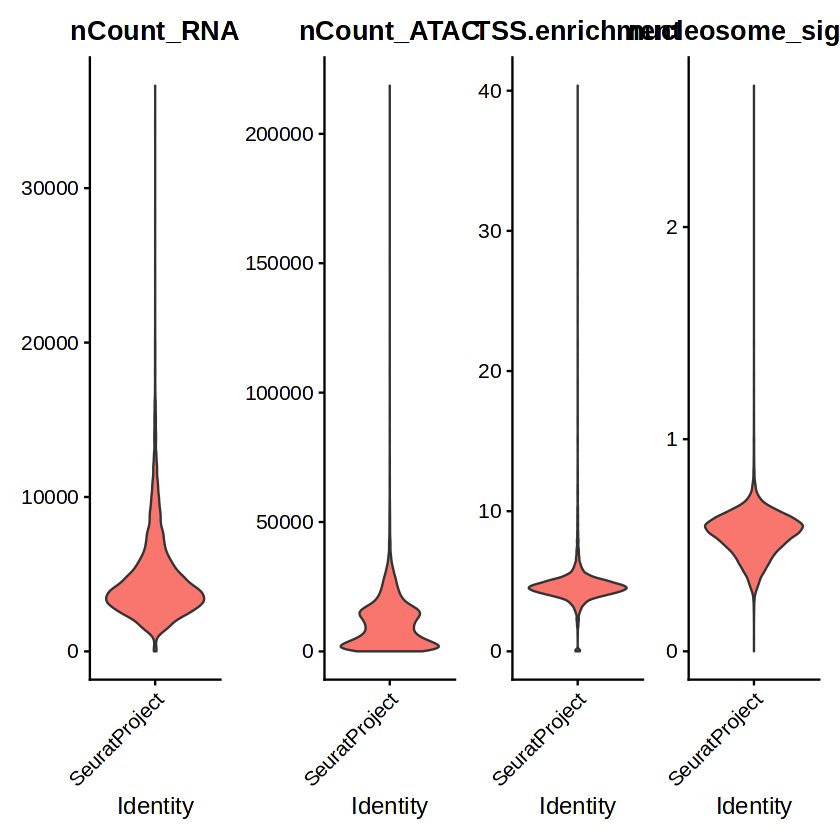

In [19]:
DefaultAssay(TDR119) <- "ATAC"

TDR119 <- NucleosomeSignal(TDR119)
TDR119 <- TSSEnrichment(TDR119)

VlnPlot(
  object = TDR119,
  features = c("nCount_RNA", "nCount_ATAC", "TSS.enrichment", "nucleosome_signal"),
  ncol = 4,
  pt.size = 0
)

In [20]:
# filter out low quality cells
# NOTE that we're not being meticulous about the thresholds here, especially the lower limits for RNA/ATAC fragment counts.

# define the unfiltered object
TDR119_unfiltered <- TDR119

# filter out the low quality cells
TDR119 <- subset(
  x = TDR119,
  subset = nCount_ATAC < 100000 &
    nCount_RNA < 25000 &
    nCount_ATAC > 1000 &
    nCount_RNA > 1000 &
    nucleosome_signal < 2 &
    TSS.enrichment > 1
)
TDR119

An object of class Seurat 
262922 features across 12125 samples within 2 assays 
Active assay: ATAC (230865 features, 0 variable features)
 1 other assay present: RNA

## Gene expression (RNA) data processing

- log-normalization, dimensionality reduction, etc.

We can normalize the gene expression data using SCTransform, and reduce the dimensionality using PCA.

In [21]:
DefaultAssay(TDR119) <- "RNA"
TDR119 <- SCTransform(TDR119)
TDR119 <- RunPCA(TDR119)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 24755 by 12125

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 84 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 24755 genes



  |======================================================================| 100%


Computing corrected count matrix for 24755 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 2.070994 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

PC_ 1 
Positive:  ttn.2, ttn.1, rbfox1l, flncb, rbm24a, mef2d, efemp2a, lama5, txlnba, tspan9a 
	   ryr1b, ldb3a, mef2cb, musk, si:ch1073-268j14.1, unc45b, arid3c, neb, bcam, plxna2 
	   nexn, palld, smyd1b, mybphb, CR936977.2, si:dkey-261h17.1, plecb, qkia, BX649294.1, tnni2b.1 
Negative:  ncam1a, nova2, tenm4, chl1a, efna2a, BX571942.1, sox13, rfx4, pax5, ncam1b 
	   zbtb16b, pax3a, pax6a, plp1a, msi1, ptprnb, ptprn2, jag2b, fgfr3, plch1 
	   rnf220a, epha4b, efna3b, pax7a, negr1, cadm1a, celsr1b, lrp2a, tox, hs3st3b1b 
PC_ 2 
Positive:  lama5, col14a1a, tp63, col7a1, tfap2c, plekha6, pcdh7b, kremen1, cldni, ank3a 
	   adamts6, col28a2a, pawr, actn1, cdh1, col12a1b, col18a1a, col11a1a, palm3, bmp6 
	   bcam, ptprfa, sept12, slit3, camk2d1, pls3, myh9a, epcam, slit2, itga3b 
Negative

# Step 2.  Annotation transfer from a reference dataset 

This is for rough annotation and cell-type specific peak calling

To annotate cell types in the dataset we can transfer cell labels from an existing PBMC reference dataset using tools in the Seurat package. See the Seurat reference mapping vignette for more information.

We’ll use an annotated PBMC reference dataset from Hao et al. (2020), available for download here: https://atlas.fredhutch.org/data/nygc/multimodal/pbmc_multimodal.h5seurat

Note that the SeuratDisk package is required to load the reference dataset. Installation instructions for SeuratDisk can be found here.

In [22]:
library(SeuratData)
library(SeuratDisk)

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



In [18]:
# setwd("/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/ZF_atlas_v01_r_files/")
# source("/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/github_repos/single-cell-utilities/read_matrix.R")

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    

In [19]:
# library(Matrix)

# # read from .mtx (better)
# counts = readMM('sparse_matrix.mtx')
# counts

# # obs data.frame
# obs = read.csv('obs.csv', header = T)
# # var data.frame
# vars = read.csv('var.csv', row.names = 1)
# # obsm UMAP coords
# obsm = read.csv('obsm.csv', header = T)

38189 x 27877 sparse Matrix of class "dgTMatrix"
                                                                                     
   [1,] . . 1 . 1 . . 1 . . . . . . . . . . .   . 22  4 1 .  . 138 . . . . 2 . ......
   [2,] . . 1 . . . . . 1 . . . . 3 . . . . .   2 21  2 . .  . 159 . . . . 2 1 ......
   [3,] . . 1 . . . . 1 . . 1 . . 1 . . . . .   2 26 10 2 2  . 302 . . . . 2 1 ......
   [4,] . . . . . . . . 1 . . . . . . . . . .   1  8  7 . 1  . 130 . . . . 3 . ......
   [5,] . . . . . . . . . . . . . . . . . . 1   . 15  . . .  . 155 . . . . 1 . ......
   [6,] . . . . . . . . . 1 1 . 1 1 . . . . .   . 18  5 . 1  1 132 . . . . 2 . ......
   [7,] . . . . . . . . . 2 . . . . . . . . .   . 23 11 1 1  . 139 . . . . 6 1 ......
   [8,] . . . . . . . . . . . . . 1 . . . . .   2 22  3 . .  . 180 . . . . 2 . ......
   [9,] 1 . . . . . . . . . . . . . . . . . . 211  5  . . .  .  63 . . . . 1 . ......
  [10,] . . 1 . . . . . . 3 . . . . . . . . .   2 12  4 1 .  . 161 . . . . 1 . ......
  [11

In [20]:
# # create the seurat object
# # name rows and cols
# # take the vars' index: should be the gene symbol! 
# colnames(counts) <- row.names(vars)
# # take obs' index: should correspond to a unique cell_id! 
# row.names(counts) <- obs[,1]

# row.names(obs) <- obs[,1]
# row.names(obsm) <- obs[,1]

# # Make Seurat object
# seurat_obj = CreateSeuratObject(counts = t(counts), meta.data = obs)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [21]:
# reference <- seurat_obj

In [23]:
reference <- LoadH5Seurat("/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/ZF_atlas_v01_15somite.h5Seurat")

Validating h5Seurat file

Initializing RNA with data

Adding counts for RNA

Adding miscellaneous information for RNA

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



In [24]:
unique(reference$timepoint)

[1] "15somite"

In [25]:
reference_15somite <- reference[, reference@meta.data$timepoint=="15somite"]
reference_15somite

An object of class Seurat 
27877 features across 6297 samples within 1 assay 
Active assay: RNA (27877 features, 0 variable features)

In [26]:
unique(reference_15somite$cell_annotation)

[1] "LateralPlate_cxcl12a.hand2"    "Macrophages_rhogb.spi1b"      
 [3] "NeuralCrest_ednrab.slc1a3a"    "Somites_msgn1"                
 [5] "Periderme_foxi3a"              "OpticCup_rx1"                 
 [7] "Midbrain_her8.zfhx4"           "OticPlacode_cldna.eya1"       
 [9] "Hindbrain_zic2b.olig3"         "PronephricDuct_hnf1ba.prxl12b"
[11] "PSN_msgn1"                     "Telencephalon_fezf2.sox1b"    
[13] "EpidermAnterior_six4b.pitx3"   "Periderm_krt5.anxa1c"         
[15] "SpinalCord.ldlrad2.hoxc3a"     "DifferentiatingNeurons_elavl3"
[17] "FloorPlate_shha.foxj1a"        "AdaxialCells_apobec2a"        
[19] "PharyngealArch.prrx1a.fibina"  "Erythroid_cpox.hbae1.3"       
[21] "unassigned"                    "Notochord_tbxta"              
[23] "Muscle_myod1"                  "Endothelial_sox7"             
[25] "NMPs_sox2.tbxta"

In [27]:
unique(reference_15somite$global_annotation)

[1] "Lateral_Mesoderm"        "Neural_Crest"           
 [3] "Somites"                 "Epidermal"              
 [5] "Neural_Anterior"         "Neural_Posterior"       
 [7] "Endoderm"                "PSM"                    
 [9] "Differentiating_Neurons" "Adaxial_Cells"          
[11] "NMPs"                    "Notochord"              
[13] "Muscle"                  "unassigned"

In [27]:
# SaveH5Seurat(reference, filename = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/ZF_atlas_v01.h5Seurat", overwrite = TRUE)

Warning message:
“Overwriting previous file /data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/ZF_atlas_v01.h5Seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA



In [28]:
# SaveH5Seurat(reference_15somite, filename = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/ZF_atlas_v01_15somite.h5Seurat", overwrite = TRUE)

Warning message:
“Overwriting previous file /data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/ZF_atlas_v01_15somite.h5Seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA



## pre-process the reference dataset before the label transfer

In [28]:
# preprocess the reference datasets
reference_15somite <- SCTransform(reference_15somite)
reference_15somite <- RunPCA(reference_15somite)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 23009 by 6297

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 84 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 23009 genes



  |======================================================================| 100%


Computing corrected count matrix for 23009 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.413169 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

PC_ 1 
Positive:  krt4, pfn1, cyt1, cfl1l, epcam, tmsb1, cldni, cyt1l, myh9a, tagln2 
	   actb1, tmsb4x, apoeb, tp63, krt8, cdh1, pak2a, zgc:171775, gpa33a, fermt1 
	   ecrg4b, ywhaz, bcam, sult2st1, krt92, dnase1l4.1, spaca4l, lgals3b, cnn2, apoc1 
Negative:  nova2, hsp90aa1.1, meox1, fn1b, BX001014.2, unc45b, efemp2b, efemp2a, si:ch211-137a8.4, tcf15 
	   ttn.1, si:dkey-56m19.5, sox3, sox19a, pcna, myod1, fabp3, tuba1c, tubb2b, ttn.2 
	   rbm24a, npm1a, hist1h4l-16, hspb1, zgc:92429, rps20, hmgb2a, cldn5a, si:ch211-286o17.1, cdh2 
PC_ 2 
Positive:  si:ch211-222l21.1, hsp90ab1, nova2, sox3, pcna, hist1h4l-16, si:ch211-137a8.4, sox19a, hist1h4l-6, marcksl1b 
	   ptmab, tubb2b, hist1h4l-11, tuba1c, hmgb2a, zgc:153409, cldn5a, zbtb16a, zgc:110425, fabp3 
	   gfap, rrm2-1, hmga1a, si:dke

In [32]:
reference_15somite <- RunUMAP(reference_15somite, reduction = "pca", dims = 1:50)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
18:17:17 UMAP embedding parameters a = 0.9922 b = 1.112

18:17:17 Read 6297 rows and found 50 numeric columns

18:17:17 Using Annoy for neighbor search, n_neighbors = 30

18:17:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:17:17 Writing NN index file to temp file /tmp/Rtmp1mPOXQ/file15575214e991c

18:17:17 Searching Annoy index using 1 thread, search_k = 3000

18:17:19 Annoy recall = 100%

18:17:21 Commencing smooth kNN distance calibration using 1 thread

18:17:24 Initializing fr

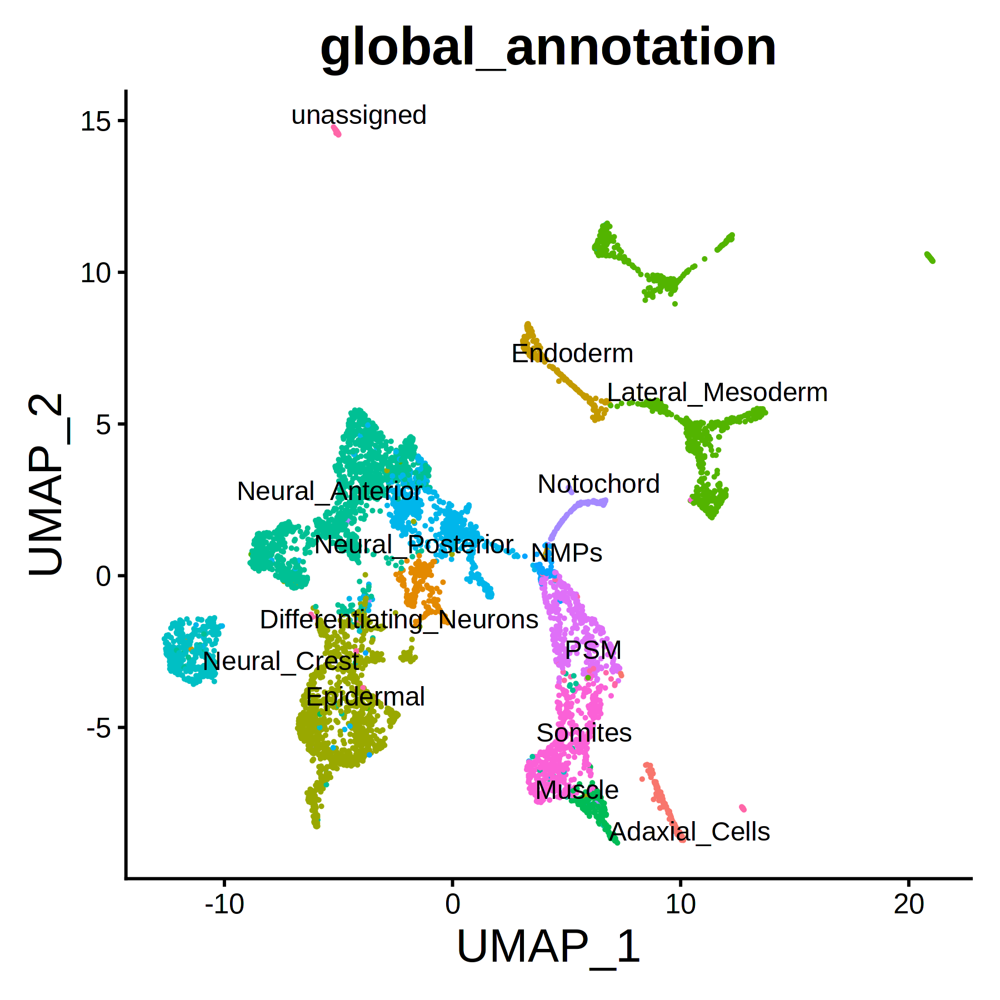

In [33]:
# Plot the UMAP with the predicted cell type labels
options(repr.plot.width = 6, repr.plot.height = 6, repr.plot.res = 300)
DimPlot(reference_15somite, group.by = "global_annotation", reduction = "umap",label = TRUE, repel=TRUE) + NoLegend() + theme(text = element_text(size = 20 ))

## Transfer the labels from the reference to the query dataset

- Using Seurat's "FindTransferAnchors": Check the documentation for the requirements.
- For now, it seems that we need to pre-process both the query and the reference datasets using "SCT" (or log-normalization, which we have to be very specific in the input arguments.)

In [34]:
# transfer cell type labels from reference to query
transfer_anchors <- FindTransferAnchors(
  reference = reference_15somite,
  query = TDR119,
  normalization.method = "SCT",
  reference.reduction = "pca",
  recompute.residuals = FALSE,
  dims = 1:50
)

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 8738 anchors



In [35]:
# predict the cell-type labels from the "global_annotation" class
predictions <- TransferData(
  anchorset = transfer_anchors, 
  refdata = reference_15somite$global_annotation,
  weight.reduction = TDR119[['pca']],
  dims = 1:50
)

TDR119 <- AddMetaData(
  object = TDR119,
  metadata = predictions
)

# set the cell identities to the cell type predictions
Idents(TDR119) <- "predicted.id"

# set a reasonable order for cell types to be displayed when plotting
# levels(pbmc) <- c("CD4 Naive", "CD4 TCM", "CD4 CTL", "CD4 TEM", "CD4 Proliferating",
#                   "CD8 Naive", "dnT",
#                  "CD8 TEM", "CD8 TCM", "CD8 Proliferating", "MAIT", "NK", "NK_CD56bright",
#                  "NK Proliferating", "gdT",
#                  "Treg", "B naive", "B intermediate", "B memory", "Plasmablast",
#                  "CD14 Mono", "CD16 Mono",
#                  "cDC1", "cDC2", "pDC", "HSPC", "Eryth", "ASDC", "ILC", "Platelet")

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [36]:
predictions

,predicted.id,prediction.score.Lateral_Mesoderm,prediction.score.Neural_Crest,prediction.score.Somites,prediction.score.Epidermal,prediction.score.Neural_Anterior,prediction.score.Neural_Posterior,prediction.score.Endoderm,prediction.score.PSM,prediction.score.Differentiating_Neurons,prediction.score.Adaxial_Cells,prediction.score.NMPs,prediction.score.Notochord,prediction.score.Muscle,prediction.score.unassigned,prediction.score.max
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAGCCACTCGCTC-1,Lateral_Mesoderm,1.000000000,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.0000000000,0,0.0000000000,0.00000000,0.00000000,0,0.0000000,0.000000000,1.0000000
AAACAGCCAGTTATGT-1,Endoderm,0.000000000,0.000000000,0.000000000,0.089182667,0.15851567,0.000000000,0.7523016680,0,0.0000000000,0.00000000,0.00000000,0,0.0000000,0.000000000,0.7523017
AAACAGCCATCTAGCA-1,Somites,0.000000000,0.000000000,0.780886509,0.000000000,0.00000000,0.000000000,0.0000000000,0,0.0000000000,0.00000000,0.00000000,0,0.2191135,0.000000000,0.7808865
AAACAGCCATTCCTCG-1,unassigned,0.000000000,0.000000000,0.000000000,0.011253363,0.00000000,0.000000000,0.0007300458,0,0.0000000000,0.00000000,0.00000000,0,0.0000000,0.988016591,0.9880166
AAACATGCAAGGTCCT-1,Adaxial_Cells,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.0000000000,0,0.0000000000,1.00000000,0.00000000,0,0.0000000,0.000000000,1.0000000
AAACATGCACGTAATT-1,Neural_Crest,0.000000000,0.978900065,0.000000000,0.000000000,0.00000000,0.000000000,0.0000000000,0,0.0000000000,0.00000000,0.00000000,0,0.0000000,0.021099935,0.9789001
AAACATGCACTGACCG-1,Neural_Anterior,0.000000000,0.000000000,0.000000000,0.000000000,0.95388596,0.046114040,0.0000000000,0,0.0000000000,0.00000000,0.00000000,0,0.0000000,0.000000000,0.9538860
AAACATGCAGGCTAGA-1,Neural_Anterior,0.000000000,0.000000000,0.000000000,0.000000000,1.00000000,0.000000000,0.0000000000,0,0.0000000000,0.00000000,0.00000000,0,0.0000000,0.000000000,1.0000000
AAACATGCATGAGCAG-1,Neural_Posterior,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,0.998911780,0.0000000000,0,0.0010882201,0.00000000,0.00000000,0,0.0000000,0.000000000,0.9989118


In [38]:
# Transfer the fine cell_annotation label

predictions_fine <- TransferData(
  anchorset = transfer_anchors, 
  refdata = reference_15somite$cell_annotation,
  weight.reduction = TDR119[['pca']],
  dims = 1:50
)

# rename the predictions_fine's colname
colnames(predictions_fine)[1] = "cell_annotation"
predictions_fine


TDR119 <- AddMetaData(
  object = TDR119,
  metadata = predictions_fine
)

# set the cell identities to the cell type predictions
Idents(TDR119) <- "predicted.id"

Finding integration vectors

Finding integration vector weights

Predicting cell labels



,cell_annotation,prediction.score.LateralPlate_cxcl12a.hand2,prediction.score.Macrophages_rhogb.spi1b,prediction.score.NeuralCrest_ednrab.slc1a3a,prediction.score.Somites_msgn1,prediction.score.Periderme_foxi3a,prediction.score.OpticCup_rx1,prediction.score.Midbrain_her8.zfhx4,prediction.score.OticPlacode_cldna.eya1,prediction.score.Hindbrain_zic2b.olig3,⋯,prediction.score.FloorPlate_shha.foxj1a,prediction.score.AdaxialCells_apobec2a,prediction.score.PharyngealArch.prrx1a.fibina,prediction.score.Erythroid_cpox.hbae1.3,prediction.score.unassigned,prediction.score.Notochord_tbxta,prediction.score.Muscle_myod1,prediction.score.Endothelial_sox7,prediction.score.NMPs_sox2.tbxta,prediction.score.max
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAGCCACTCGCTC-1,LateralPlate_cxcl12a.hand2,1.000000000,0,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.000000000,0,0.0000000,0,0,1.0000000
AAACAGCCAGTTATGT-1,unassigned,0.000000000,0,0.000000000,0.000000000,0.000000000,0.01237471,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.752301668,0,0.0000000,0,0,0.7523017
AAACAGCCATCTAGCA-1,Somites_msgn1,0.000000000,0,0.000000000,0.780886509,0.000000000,0.00000000,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.000000000,0,0.2191135,0,0,0.7808865
AAACAGCCATTCCTCG-1,unassigned,0.000000000,0,0.000000000,0.000000000,0.010876722,0.00000000,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.988016591,0,0.0000000,0,0,0.9880166
AAACATGCAAGGTCCT-1,AdaxialCells_apobec2a,0.000000000,0,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,0,0.000000000,⋯,0,1.00000000,0.00000000,0,0.000000000,0,0.0000000,0,0,1.0000000
AAACATGCACGTAATT-1,NeuralCrest_ednrab.slc1a3a,0.000000000,0,0.978900065,0.000000000,0.000000000,0.00000000,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.021099935,0,0.0000000,0,0,0.9789001
AAACATGCACTGACCG-1,Midbrain_her8.zfhx4,0.000000000,0,0.000000000,0.000000000,0.000000000,0.00000000,0.95388596,0,0.046114040,⋯,0,0.00000000,0.00000000,0,0.000000000,0,0.0000000,0,0,0.9538860
AAACATGCAGGCTAGA-1,Telencephalon_fezf2.sox1b,0.000000000,0,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.000000000,0,0.0000000,0,0,1.0000000
AAACATGCATGAGCAG-1,SpinalCord.ldlrad2.hoxc3a,0.000000000,0,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,0,0.000000000,⋯,0,0.00000000,0.00000000,0,0.000000000,0,0.0000000,0,0,0.9989118


In [40]:
# DefaultAssay(TDR119) <- "SCT"

# ElbowPlot(TDR119, reduction = "pca")

In [47]:
TDR119 <- RunUMAP(TDR119, reduction = "pca", dims = 1:40)
TDR119 <- FindNeighbors(TDR119, reduction = "pca", dims = 1:40)
TDR119 <- FindClusters(TDR119, resolution = 0.5)

18:24:01 UMAP embedding parameters a = 0.9922 b = 1.112

18:24:01 Read 12125 rows and found 40 numeric columns

18:24:01 Using Annoy for neighbor search, n_neighbors = 30

18:24:01 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:24:03 Writing NN index file to temp file /tmp/Rtmp1mPOXQ/file15575601b9fc0

18:24:03 Searching Annoy index using 1 thread, search_k = 3000

18:24:06 Annoy recall = 100%

18:24:08 Commencing smooth kNN distance calibration using 1 thread

18:24:12 Initializing from normalized Laplacian + noise

18:24:12 Commencing optimization for 200 epochs, with 505640 positive edges

18:24:18 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12125
Number of edges: 432725

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9271
Number of communities: 18
Elapsed time: 0 seconds


In [49]:
TDR119

An object of class Seurat 
287677 features across 12125 samples within 3 assays 
Active assay: SCT (24755 features, 3000 variable features)
 2 other assays present: RNA, ATAC
 2 dimensional reductions calculated: pca, umap

In [43]:
# TDR119 <- RunUMAP(TDR119, reduction = "pca", dims = 1:30, reduction.name = "umap.pca30")
# options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
# DimPlot(TDR119, group.by = "predicted.id", reduction = "umap.pca30",label = TRUE) + NoLegend() + theme(text = element_text(size = 20 ))

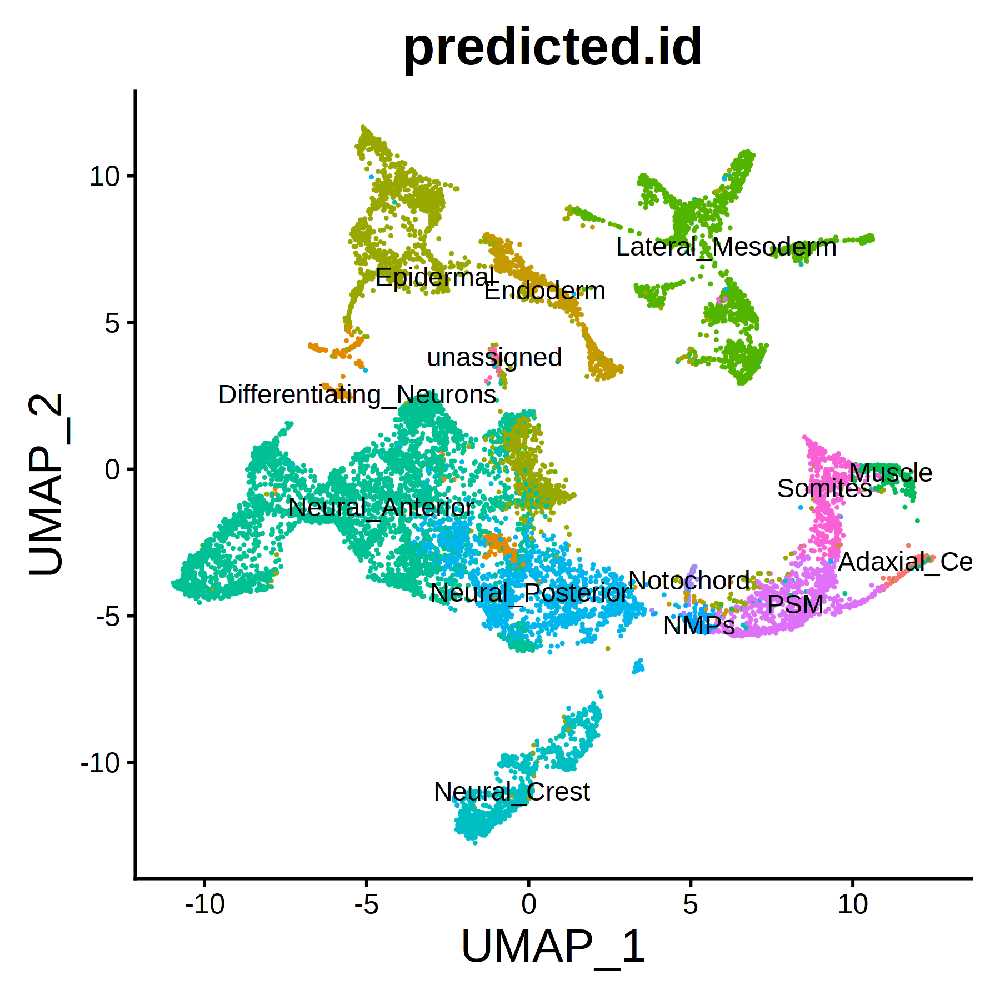

In [50]:
DimPlot(TDR119, group.by = "predicted.id", reduction = "umap",label = TRUE) + NoLegend() + theme(text = element_text(size = 20 ))

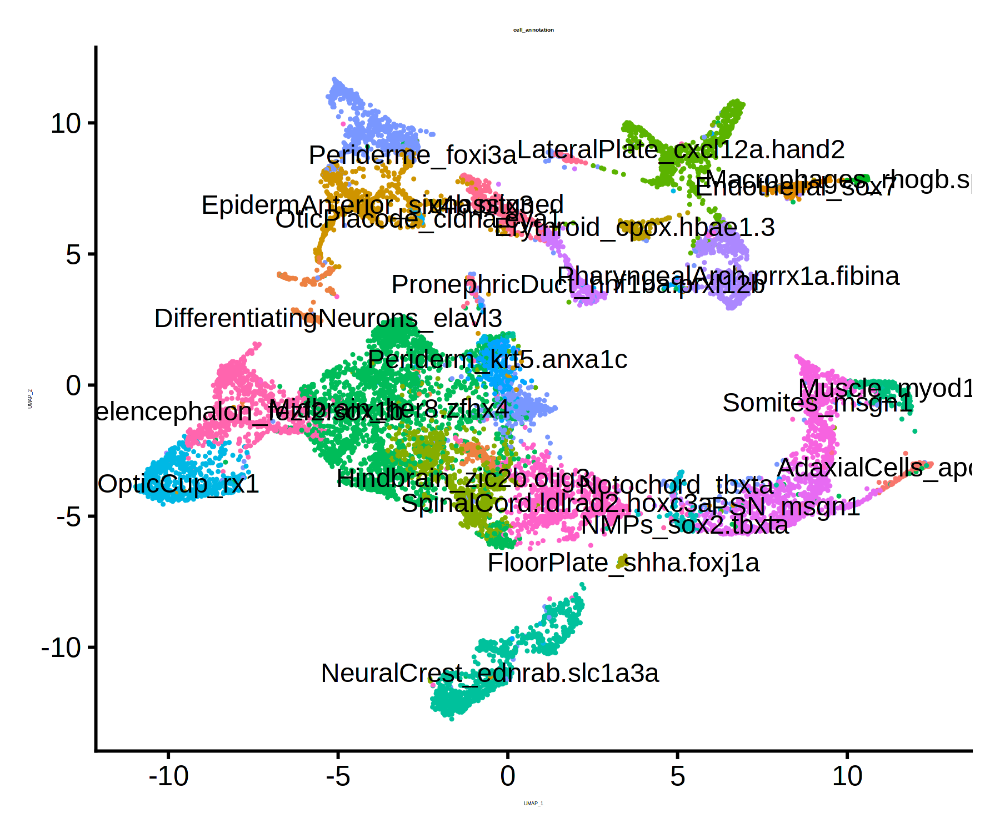

In [57]:
# Plot the UMAP with the predicted cell type labels
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
DimPlot(TDR119, group.by = "cell_annotation", reduction = "umap", label=TRUE) + NoLegend() + theme(text = element_text(size = 2 ))

In [15]:
# # Assuming unique_predicted_ids contains the unique predicted IDs
# unique_predicted_ids <- c('CD4 Naive', 'CD4 TCM', 'CD8 Naive', 'CD16 Mono', 'NK', 'Treg',
#                           'CD14 Mono', 'NK Proliferating', 'CD8 TCM', 'B intermediate',
#                           'cDC2', 'B memory', 'Plasmablast', 'CD4 TEM', 'MAIT',
#                           'CD8 TEM', 'dnT', 'B naive', 'gdT', 'pDC', 'NK_CD56bright',
#                           'CD4 CTL', 'ILC', 'HSPC', 'Eryth', 'cDC1', 'Platelet',
#                           'CD4 Proliferating', 'CD8 Proliferating', 'ASDC')

# # Define the mapping dictionary
# coarse_mapping <- c('CD4 Naive' = 'CD4 T',
#                     'CD4 TCM' = 'CD4 T',
#                     'CD8 Naive' = 'CD8 T',
#                     'CD16 Mono' = 'Monocyte',
#                     'NK' = 'NK',
#                     'Treg' = 'Treg',
#                     'CD14 Mono' = 'Monocyte',
#                     'NK Proliferating' = 'NK',
#                     'CD8 TCM' = 'CD8 T',
#                     'B intermediate' = 'B',
#                     'cDC2' = 'DC',
#                     'B memory' = 'B',
#                     'Plasmablast' = 'Plasmablast',
#                     'CD4 TEM' = 'CD4 T',
#                     'MAIT' = 'MAIT',
#                     'CD8 TEM' = 'CD8 T',
#                     'dnT' = 'T',
#                     'B naive' = 'B',
#                     'gdT' = 'T',
#                     'pDC' = 'DC',
#                     'NK_CD56bright' = 'NK',
#                     'CD4 CTL' = 'CD4 T',
#                     'ILC' = 'ILC',
#                     'HSPC' = 'HSPC',
#                     'Eryth' = 'Eryth',
#                     'cDC1' = 'DC',
#                     'Platelet' = 'Platelet',
#                     'CD4 Proliferating' = 'CD4 T',
#                     'CD8 Proliferating' = 'CD8 T',
#                     'ASDC' = 'ASDC')

# # Map the fine-grained cell labels to coarse labels using the coarse_mapping dictionary
# pbmc$predicted.id.coarse <- coarse_mapping[match(pbmc$predicted.id, names(coarse_mapping))]

# # Print the updated metadata to confirm the changes
# pbmc@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,nCount_SCT,⋯,prediction.score.ASDC,prediction.score.HSPC,prediction.score.Platelet,prediction.score.NK_CD56bright,prediction.score.CD4.Proliferating,prediction.score.Eryth,prediction.score.cDC1,prediction.score.ILC,prediction.score.max,predicted.id.coarse
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAACAGCCAAGGAATC-1,SeuratProject,8380,3308,55582,13878,0.9033063,0.42,5.130258,0.90,4666,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9512239,CD4 T
AAACAGCCAATCCCTT-1,SeuratProject,3771,1896,20495,7253,0.8843612,0.37,4.488912,0.49,3777,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.6679144,CD4 T
AAACAGCCAATGCGCT-1,SeuratProject,6876,2904,16674,6528,0.9695535,0.61,4.325205,0.35,4653,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9894333,CD4 T
AAACAGCCACACTAAT-1,SeuratProject,1733,846,2007,906,0.9532164,0.56,4.523255,0.52,3342,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.4440737,CD8 T
AAACAGCCACCAACCG-1,SeuratProject,5415,2282,7658,3323,0.9165488,0.46,3.825122,0.07,4461,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9098514,CD8 T
AAACAGCCAGGATAAC-1,SeuratProject,2759,1353,10355,4267,0.8138075,0.21,4.385462,0.40,3315,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9435908,CD4 T
AAACAGCCAGTAGGTG-1,SeuratProject,7614,3061,39454,11633,0.8740804,0.34,4.754957,0.72,4697,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9389931,CD8 T
AAACAGCCAGTTTACG-1,SeuratProject,3633,1691,20523,7245,0.7459677,0.10,4.565000,0.56,3668,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9414046,CD4 T
AAACAGCCATCCAGGT-1,SeuratProject,7782,3028,22412,8602,0.8098802,0.20,4.111417,0.20,4647,⋯,0,0,0.00000000,0,0,0.000000000,0,0,0.9890811,Monocyte


# Step 3.  Peak calling (cell-type specific)

Signac: The set of peaks identified using Cellranger often merges distinct peaks that are close together. This can create a problem for certain analyses, particularly motif enrichment analysis and peak-to-gene linkage. To identify a more accurate set of peaks, we can call peaks using MACS2 with the CallPeaks() function. Here we call peaks on all cells together, but we could identify peaks for each group of cells separately by setting the group.by parameter, and this can help identify peaks specific to rare cell populations.

Peak calling should be done with different options, then should be compared with each other using "Coverage plot"

- bulk (MACS2)
- cell type (coarse, MACS2)
- cell type (fine, MACS2)
- etc.


Note. Peak-calling is quite computationally heavy, it might be a good idea to run it on HPC.

In [58]:
TDR119

An object of class Seurat 
287677 features across 12125 samples within 3 assays 
Active assay: SCT (24755 features, 3000 variable features)
 2 other assays present: RNA, ATAC
 2 dimensional reductions calculated: pca, umap

In [59]:
# Change the Default Assay to "ATAC" for calling peaks
DefaultAssay(TDR119) <- "ATAC"

In [60]:
# call peaks using the coarse annotation (predicted)
peaks <- CallPeaks(
  object = TDR119,
  group.by = "predicted.id"
)

Processing file /data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR119/outs/atac_fragments.tsv.gz






In [61]:
peaks

GRanges object with 267308 ranges and 1 metadata column:
           seqnames            ranges strand |         peak_called_in
              <Rle>         <IRanges>  <Rle> |            <character>
       [1]        1         3641-3870      * |        Neural_Anterior
       [2]        1         4965-5634      * | Neural_Anterior,Epid..
       [3]        1         5767-6083      * | PSM,Neural_Anterior,..
       [4]        1       11013-12914      * | Neural_Anterior,Late..
       [5]        1       14672-14989      * | Neural_Crest,Neural_..
       ...      ...               ...    ... .                    ...
  [267304]       25 37498381-37498939      * | Lateral_Mesoderm,Neu..
  [267305]       25 37499511-37500021      * | Lateral_Mesoderm,Neu..
  [267306]       25 37501097-37501680      * | Neural_Posterior,Lat..
  [267307]       MT           29-3456      * | Neural_Anterior,Endo..
  [267308]       MT       13384-16487      * | Neural_Crest,Neural_..
  -------
  seqinfo: 26 sequences

In [64]:
annotation

new("standardGeneric", .Data = function (object, ...) 
standardGeneric("annotation"), generic = "annotation", package = "BiocGenerics", 
    group = list(), valueClass = character(0), signature = "object", 
    default = NULL, skeleton = (function (object, ...) 
    stop(gettextf("invalid call in method dispatch to '%s' (no default method)", 
        "annotation"), domain = NA))(object, ...))
<bytecode: 0x5625309098e8>
<environment: 0x562530909088>
attr(,"generic")
[1] "annotation"
attr(,"generic")attr(,"package")
[1] "BiocGenerics"
attr(,"package")
[1] "BiocGenerics"
attr(,"group")
list()
attr(,"valueClass")
character(0)
attr(,"signature")
[1] "object"
attr(,"default")
`\001NULL\001`
attr(,"skeleton")
(function (object, ...) 
stop(gettextf("invalid call in method dispatch to '%s' (no default method)", 
    "annotation"), domain = NA))(object, ...)
attr(,"class")
[1] "standardGeneric"
attr(,"class")attr(,"package")
[1] "methods"

In [65]:
# Choose a set of peaks from the above Coverage Plot, then create a new object to replace the original ATAC object

peaks <- peaks

# remove peaks on nonstandard chromosomes and in genomic blacklist regions
peaks <- keepStandardChromosomes(peaks, pruning.mode = "coarse")
# peaks <- subsetByOverlaps(x = peaks, ranges = blacklist_hg38_unified, invert = TRUE)

# quantify counts in each peak
macs2_counts <- FeatureMatrix(
  fragments = Fragments(TDR119),
  features = peaks,
  cells = colnames(TDR119)
)

# create a new assay using the MACS2 peak set and add it to the Seurat object
TDR119[["peaks_celltype"]] <- CreateChromatinAssay(
  counts = macs2_counts,
  fragments = fragpath,
  #annotation = annotation
)

Computing hash

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from peaks_celltype_ to peakscelltype_”


In [252]:
TDR119

An object of class Seurat 
619951 features across 13022 samples within 4 assays 
Active assay: ATAC (248320 features, 0 variable features)
 3 other assays present: RNA, SCT, peaks_celltype
 2 dimensional reductions calculated: pca, umap

In [254]:
DefaultAssay(TDR118)<-"peaks_celltype"
TDR118

An object of class Seurat 
619951 features across 13022 samples within 4 assays 
Active assay: peaks_celltype (316881 features, 0 variable features)
 3 other assays present: RNA, ATAC, SCT
 2 dimensional reductions calculated: pca, umap

In [255]:
# preprocess the data (dim.reduction for UMAP)
TDR118 <- FindTopFeatures(TDR118, min.cutoff = 5)
TDR118 <- RunTFIDF(TDR118)
TDR118 <- RunSVD(TDR118)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

10:28:33 UMAP embedding parameters a = 0.9922 b = 1.112

10:28:33 Read 13022 rows and found 39 numeric columns

10:28:33 Using Annoy for neighbor search, n_neighbors = 30

10:28:33 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:28:35 Writing NN index file to temp file /tmp/RtmpcMsTjq/filef07eaeeb6dc

10:28:35 Searching Annoy index using 10 threads, search_k = 3000

10:28:35 Annoy recall = 100%

10:28:40 Commencing smooth kNN distance calibration using 10 threads

10:28:45 Initializing from normalized Laplacian + noise

10:28:46 Commencing optimization for 200 epochs, with 529542 positive edges

10:28:54 Optimization finished

Warning message:
“Cannot add objects with duplicate keys (offending ke

In [282]:
TDR118

An object of class Seurat 
619951 features across 13022 samples within 4 assays 
Active assay: peaks_celltype (316881 features, 316880 variable features)
 3 other assays present: RNA, ATAC, SCT
 5 dimensional reductions calculated: pca, umap, lsi, atac.umap, wnn.umap

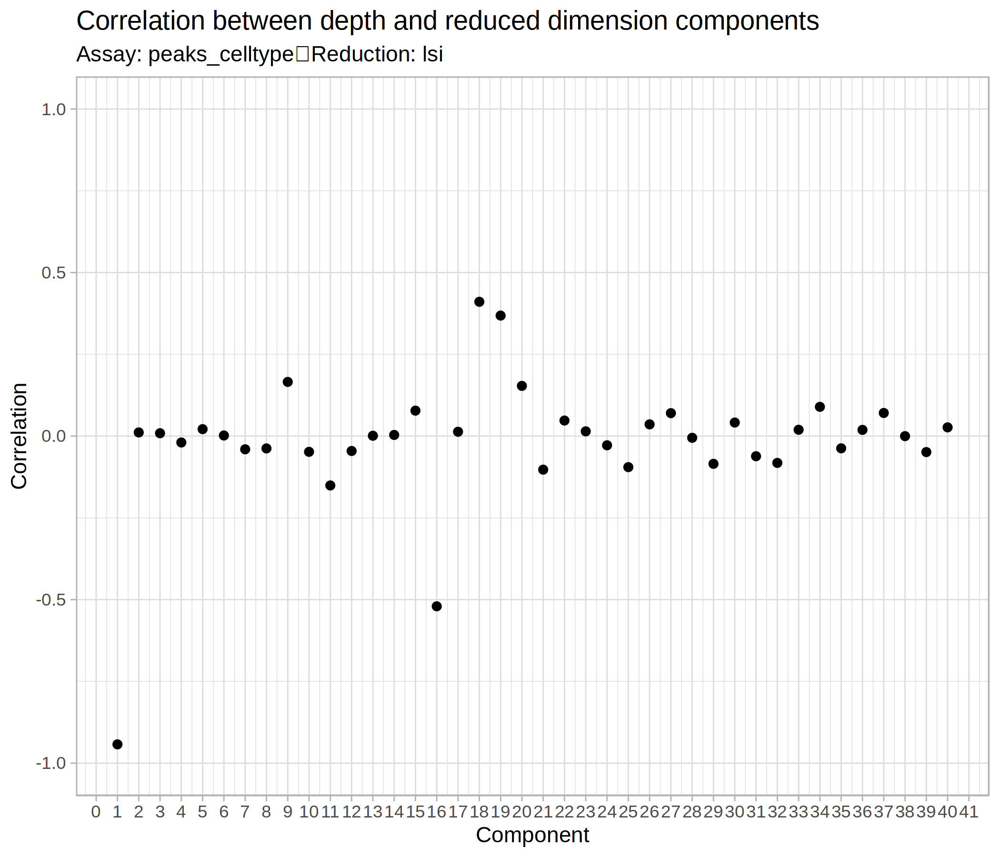

In [284]:
# Check the LSI dimensionality reduction
DepthCor(TDR118, n=40) 

### NOTE
We will get rid of the LSI components whose absolute values are close or higher than 0.5

In [286]:
# UMAP
TDR118 <- RunUMAP(TDR118, reduction = 'lsi', dims = c(2:15,17,20:40), assay = 'peaks_celltype', 
              reduction.name = 'atac.umap')

16:10:41 UMAP embedding parameters a = 0.9922 b = 1.112

16:10:41 Read 13022 rows and found 36 numeric columns

16:10:41 Using Annoy for neighbor search, n_neighbors = 30

16:10:41 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:10:43 Writing NN index file to temp file /tmp/RtmpcMsTjq/filef07e1ce7b782

16:10:43 Searching Annoy index using 10 threads, search_k = 3000

16:10:43 Annoy recall = 100%

16:10:46 Commencing smooth kNN distance calibration using 10 threads

16:10:51 Initializing from normalized Laplacian + noise

16:10:51 Commencing optimization for 200 epochs, with 533494 positive edges

16:10:59 Optimization finished

Warning message:
“Cannot add objects with duplicate keys (offending key: UMAP_) setting key to original value 'atac.umap_'”


In [326]:
# options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
# DimPlot(TDR118, reduction = "atac.umap", label=TRUE, group.by = "predicted.id") + NoLegend()+ theme(text = element_text(size = 20 ))

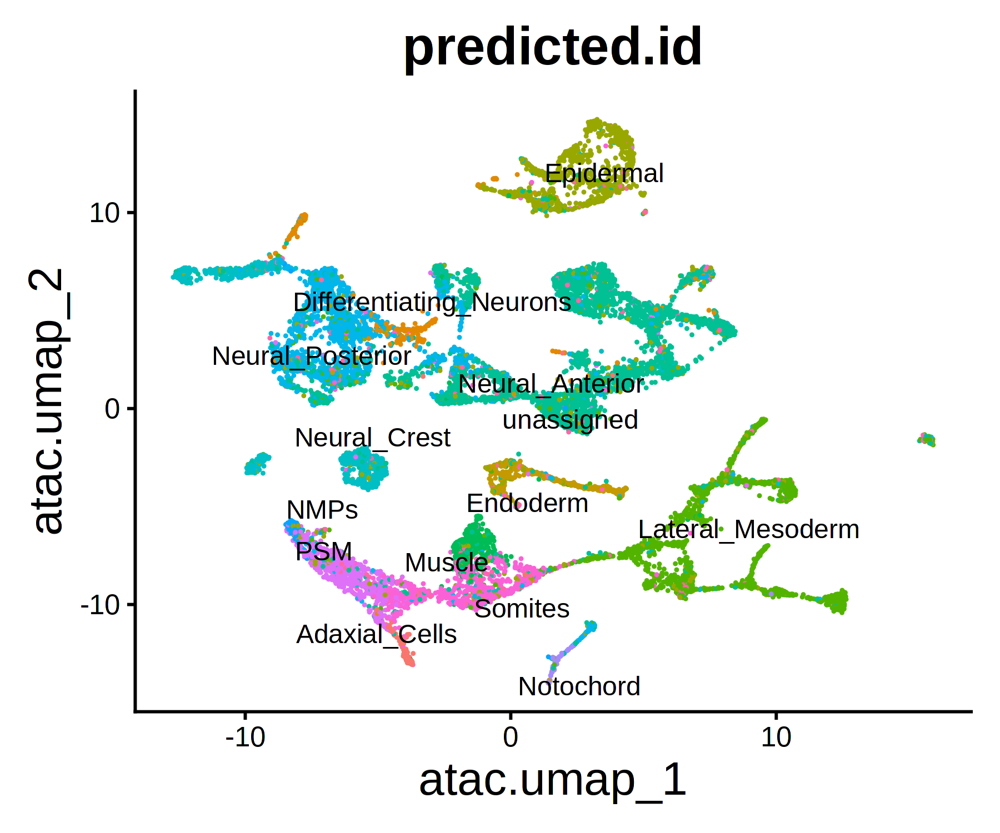

In [329]:
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
DimPlot(TDR118, reduction = "atac.umap", group.by = "predicted.id", label = TRUE, repel=TRUE) + NoLegend() +  theme(text = element_text(size = 20 ))

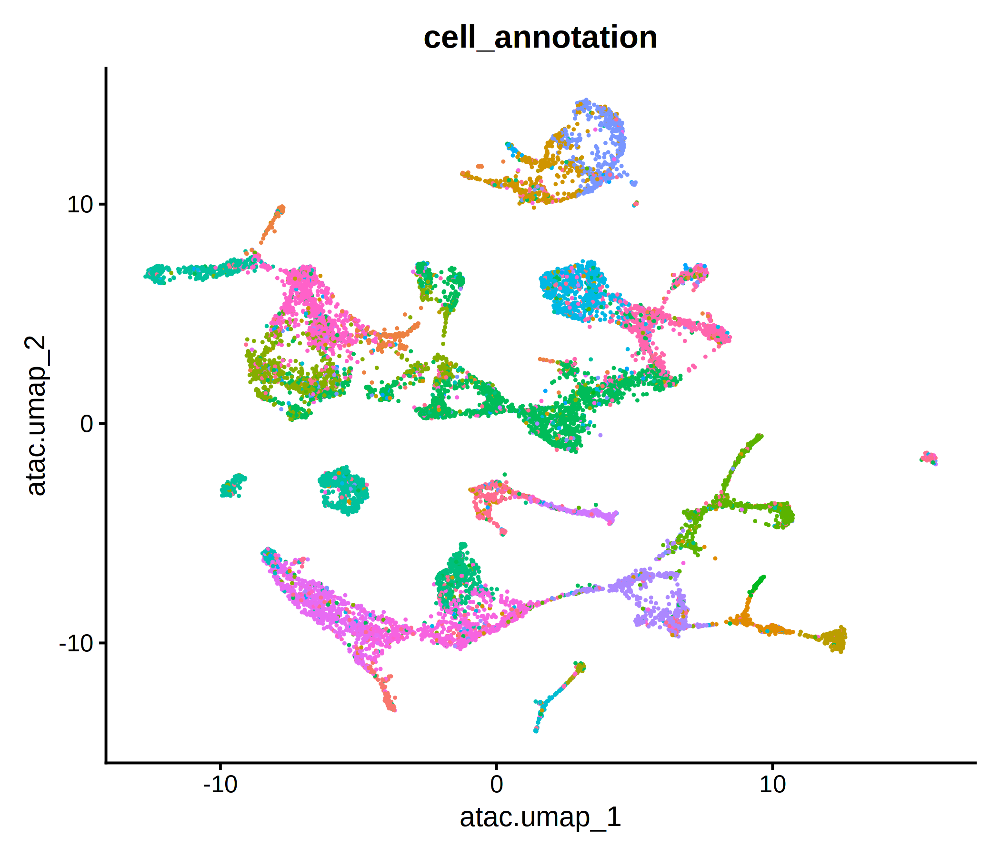

In [309]:
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 300)
DimPlot(TDR118, reduction = "atac.umap", group.by = "cell_annotation", label = FALSE) + NoLegend()

### Joint embedding (RNA + ATAC)

Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph

16:15:15 UMAP embedding parameters a = 0.9922 b = 1.112

16:15:18 Commencing smooth kNN distance calibration using 10 threads

16:15:24 Initializing from normalized Laplacian + noise

16:15:24 Commencing optimization for 200 epochs, with 399634 positive edges

16:15:32 Optimization finished



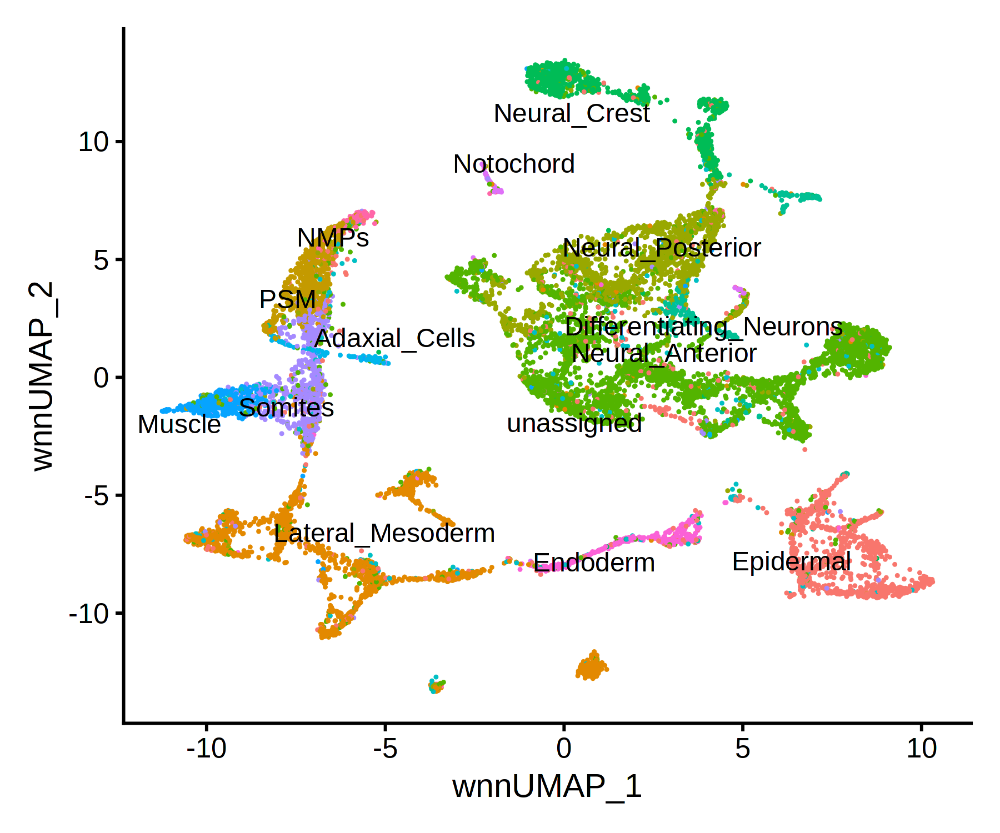

In [289]:
# Then, let's compute the weighted nearest neighbors and a joint embedding (UMAP)
TDR118 <- FindMultiModalNeighbors(TDR118,reduction.list = list("pca", "lsi"), dims.list = list(1:40, c(2:15,17,20:40)))
TDR118 <- RunUMAP(TDR118, nn.name = "weighted.nn", n.neighbors = 30, 
                reduction.name = "wnn.umap", reduction.key = "wnnUMAP_")
# TDR118 <- FindClusters(TDR118, graph.name = "wsnn", algorithm = 4, verbose = FALSE)

DimPlot(TDR118, label = TRUE, repel = TRUE, reduction = "wnn.umap") + NoLegend()

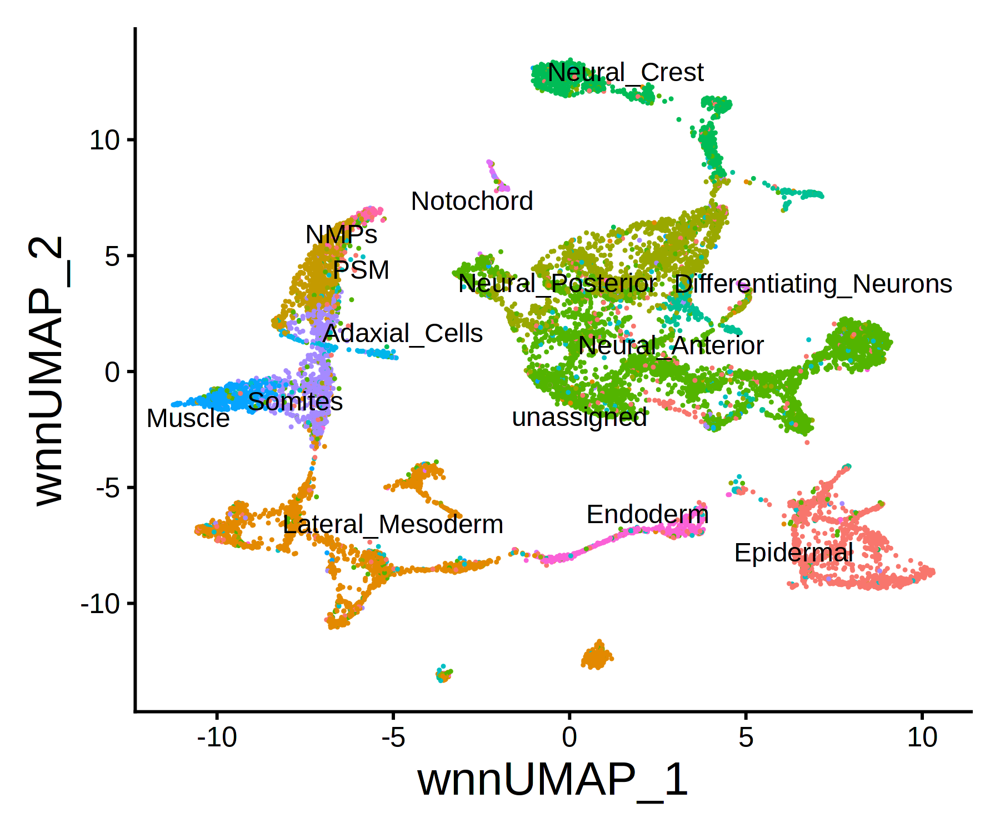

In [330]:
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
DimPlot(TDR118, label = TRUE, repel = TRUE, reduction = "wnn.umap") + NoLegend() +  theme(text = element_text(size = 20 ))

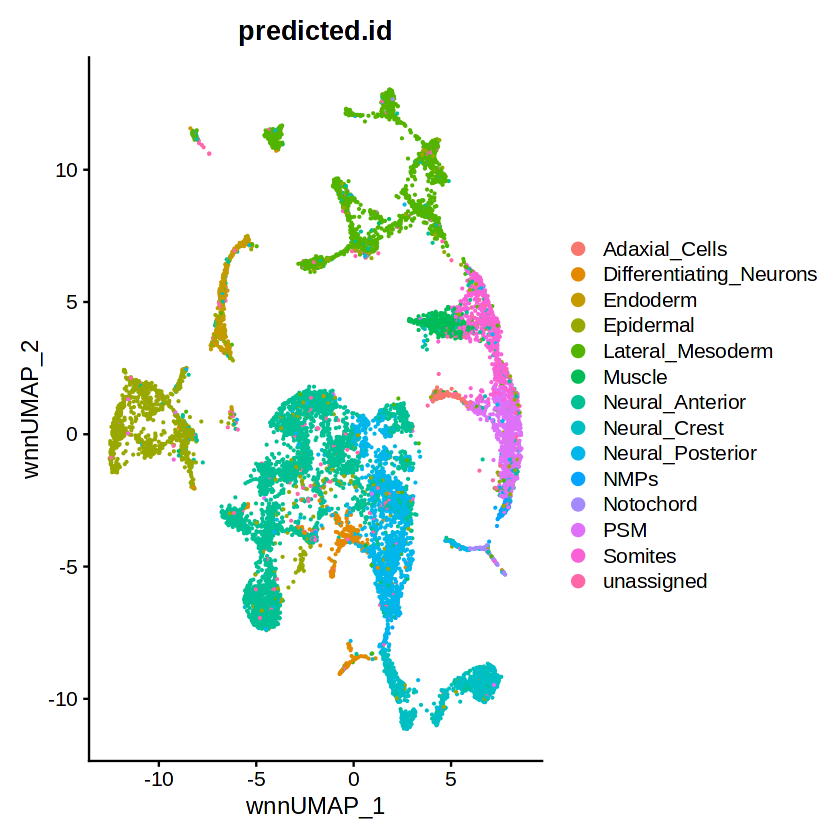

In [262]:
DimPlot(TDR118, reduction = "wnn.umap", group.by = "predicted.id")

In [303]:
# Generating a UMAP with Cellranger-arc peaks
DefaultAssay(TDR118) <- "ATAC"

# preprocess the data (dim.reduction for UMAP)
TDR118 <- FindTopFeatures(TDR118, assay = "ATAC", min.cutoff = 5)
TDR118 <- RunTFIDF(TDR118)
TDR118 <- RunSVD(TDR118, reduction.name = "lsi.cellranger")

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

Warning message:
“Cannot add objects with duplicate keys (offending key: LSI_), setting key to 'lsi.cellranger_'”


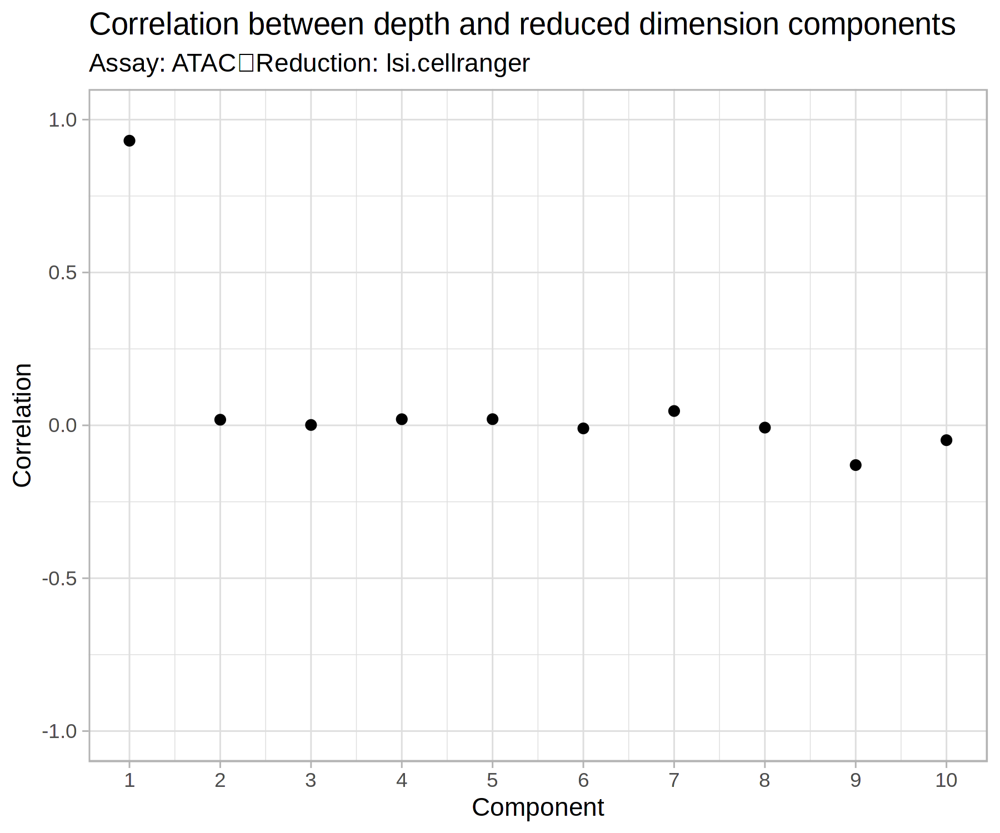

In [304]:
DepthCor(TDR118, reduction = "lsi.cellranger")

In [305]:
# UMAP
TDR118 <- RunUMAP(TDR118, reduction = 'lsi.cellranger', dims = c(2:40), assay = 'ATAC', 
              reduction.name = 'atac.umap.cellranger')



16:37:35 UMAP embedding parameters a = 0.9922 b = 1.112

16:37:35 Read 13022 rows and found 39 numeric columns

16:37:35 Using Annoy for neighbor search, n_neighbors = 30

16:37:35 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:37:37 Writing NN index file to temp file /tmp/RtmpcMsTjq/filef07e19703e8a

16:37:37 Searching Annoy index using 10 threads, search_k = 3000

16:37:37 Annoy recall = 100%

16:37:40 Commencing smooth kNN distance calibration using 10 threads

16:37:45 Initializing from normalized Laplacian + noise

16:37:46 Commencing optimization for 200 epochs, with 529736 positive edges

16:37:53 Optimization finished

Warning message:
“Cannot add objects with duplicate keys (offending key: UMAP_), setting key to 'atac.umap.cellranger_'”


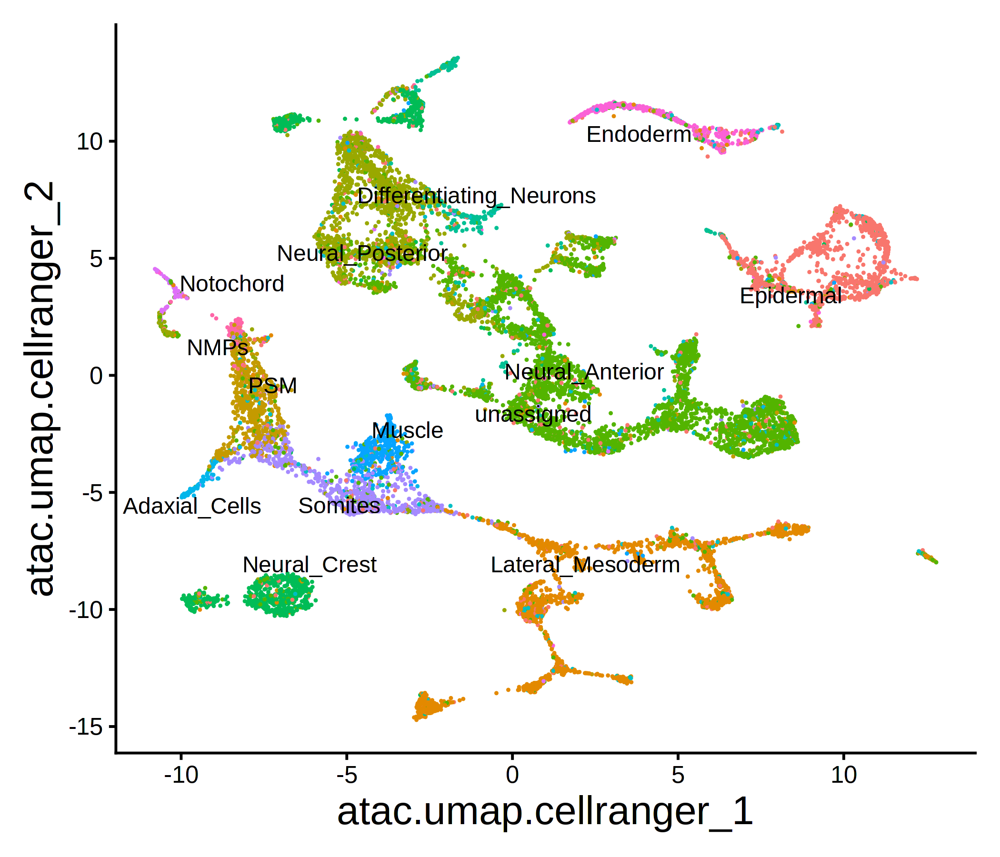

In [307]:
options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 300)
DimPlot(TDR118, label = TRUE, repel = TRUE, reduction = "atac.umap.cellranger") + NoLegend() + theme(text = element_text(size = 20 ))

In [441]:
TDR118@assays$ATAC@annotation

GRanges object with 1152211 ranges and 20 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

In [440]:
TDR118@assays$peaks_celltype@annotation

GRanges object with 1152211 ranges and 20 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

In [362]:
annotation[annotation$gene_name=="tbxta"]

GRanges object with 1 range and 20 metadata columns:
      seqnames            ranges strand |         source     type     score
         <Rle>         <IRanges>  <Rle> |       <factor> <factor> <numeric>
  [1]       19 14187540-14191592      - | ensembl_havana     gene        NA
          phase            gene_id gene_version   gene_name    gene_source
      <integer>        <character>  <character> <character>    <character>
  [1]      <NA> ENSDARG00000101576            2       tbxta ensembl_havana
        gene_biotype transcript_id transcript_version transcript_name
         <character>   <character>        <character>     <character>
  [1] protein_coding          <NA>               <NA>            <NA>
      transcript_source transcript_biotype exon_number     exon_id exon_version
            <character>        <character> <character> <character>  <character>
  [1]              <NA>               <NA>        <NA>        <NA>         <NA>
       protein_id protein_version         ta

### NOTE.
- For zebrafish GTF file (which was used for algining the first version of the zebrahub) does not have "transcript_id" column nor "tx_id" column. It has "gene_name", and for duplicates, it actually has different "gene_id" (ensemble ids). 

- github issue link:

- Signac requires the annotation object (GRanges object) to contain "tx_id" column for it to recognize the unique entry from the object. So, we will just copy the "gene_id" to "tx_id" and "transcript_id" columns.



In [438]:
annotation[annotation$gene_name=="phtf2"]

GRanges object with 2 ranges and 21 metadata columns:
      seqnames      ranges strand |   source        type     score     phase
         <Rle>   <IRanges>  <Rle> | <factor> <character> <numeric> <integer>
  [1]     chr4 31259-45642      + |  ensembl         gap        NA      <NA>
  [2]     chr4 38344-45396      + |  ensembl         gap        NA      <NA>
                 gene_id gene_version   gene_name gene_source   gene_biotype
             <character>  <character> <character> <character>    <character>
  [1] ENSDARG00000102123            4       phtf2     ensembl protein_coding
  [2] ENSDARG00000114503            1       phtf2     ensembl protein_coding
           transcript_id transcript_version transcript_name transcript_source
             <character>        <character>     <character>       <character>
  [1] ENSDARG00000102123               <NA>            <NA>              <NA>
  [2] ENSDARG00000114503               <NA>            <NA>              <NA>
      transcript_b

In [435]:
TDR118@assays$ATAC@annotation

GRanges object with 1152211 ranges and 20 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

In [442]:
NOTE.
For zebrafish GTF file (which was used for algining the first version of the zebrahub) does not have "transcript_id" column nor "tx_id" column. It has "gene_name", and for duplicates, it actually has different "gene_id" (ensemble ids).
github issue link:
Signac requires the annotation object (GRanges object) to contain "tx_id" column for it to recognize the unique entry from the object. So, we will just copy the "gene_id" to "tx_id" and "transcript_id" columns.

annotation <- TDR118@assays$ATAC@annotation

# copy the "gene_id" for the "tx_id" and "transcript_id" 
annotation$tx_id <- annotation$gene_id
annotation$transcript_id <- annotation$gene_id

# Add the annotation back to the main object
Annotation(TDR118) <- annotation
TDR118@assays$ATAC@annotation

GRanges object with 1152211 ranges and 20 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

In [445]:
TDR118@assays$ATAC@annotation<- annotation

In [446]:
TDR118@assays$ATAC@annotation

GRanges object with 1152211 ranges and 21 metadata columns:
            seqnames      ranges strand |   source       type     score
               <Rle>   <IRanges>  <Rle> | <factor>   <factor> <numeric>
        [1]        4 17308-18211      - |  ensembl gene              NA
        [2]        4 17308-18211      - |  ensembl transcript        NA
        [3]        4 18134-18211      - |  ensembl exon              NA
        [4]        4 18134-18211      - |  ensembl CDS               NA
        [5]        4 17948-18046      - |  ensembl exon              NA
        ...      ...         ...    ... .      ...        ...       ...
  [1152207]       MT 16449-16520      + |   RefSeq transcript        NA
  [1152208]       MT 16449-16520      + |   RefSeq exon              NA
  [1152209]       MT 16527-16596      - |   RefSeq gene              NA
  [1152210]       MT 16527-16596      - |   RefSeq transcript        NA
  [1152211]       MT 16527-16596      - |   RefSeq exon              NA
    

In [402]:
# # Assuming 'annotation' is your existing GRanges object
# types <- c("exon", "gap", "utr", "cds")

# # Get unique gene names
# unique_gene_names <- unique(annotation$gene_name)

# # Initialize the types vector with "exon" for all gene names
# types_vector <- rep("exon", length(unique_gene_names))

# # Get the counts of each gene name
# gene_counts <- table(annotation$gene_name)

# # Find gene names with more than 5 duplicates
# gene_names_with_more_than_5_duplicates <- unique_gene_names[gene_counts > 5]

# # Assign "utr" for gene names with more than 5 duplicates
# types_vector[unique_gene_names %in% gene_names_with_more_than_5_duplicates] <- "utr"

# # Determine the indices for adding "utr" from the fifth duplicate onwards
# utr_indices <- seq_along(types_vector) > 4

# # Add "utr" for indices from the fifth duplicate onwards
# types_vector[utr_indices] <- "utr"

# # Assign the types based on the gene names
# metadata(annotation)$type <- types_vector[match(annotation$gene_name, unique_gene_names)]

# # Replace type values with the defined types
# metadata(annotation)$type <- types[match(metadata(annotation)$type, types)]

# # View the modified annotation
# annotation

GRanges object with 31980 ranges and 21 metadata columns:
          seqnames      ranges strand |   source        type     score
             <Rle>   <IRanges>  <Rle> | <factor> <character> <numeric>
      [1]     chr4 17308-18211      - |  ensembl        exon        NA
      [2]     chr4 31259-45642      + |  ensembl        exon        NA
      [3]     chr4 38344-45396      + |  ensembl        exon        NA
      [4]     chr4 48519-53370      - |  ensembl        exon        NA
      [5]     chr4 57034-64703      - |  ensembl        exon        NA
      ...      ...         ...    ... .      ...         ...       ...
  [31976]     chrM 14714-15232      - |   RefSeq        exon        NA
  [31977]     chrM 15233-15301      - |   RefSeq        exon        NA
  [31978]     chrM 15308-16448      + |   RefSeq        exon        NA
  [31979]     chrM 16449-16520      + |   RefSeq        exon        NA
  [31980]     chrM 16527-16596      - |   RefSeq        exon        NA
              phase

In [447]:
unique(annotation$type)

[1] gene            transcript      exon            CDS            
[5] start_codon     stop_codon      five_prime_utr  three_prime_utr
[9] Selenocysteine 
9 Levels: gene transcript exon CDS start_codon stop_codon ... Selenocysteine

In [393]:
TDR118@assays$ATAC@annotation

GRanges object with 31980 ranges and 21 metadata columns:
          seqnames      ranges strand |   source        type     score
             <Rle>   <IRanges>  <Rle> | <factor> <character> <numeric>
      [1]        4 17308-18211      - |  ensembl        exon        NA
      [2]        4 31259-45642      + |  ensembl        exon        NA
      [3]        4 38344-45396      + |  ensembl        exon        NA
      [4]        4 48519-53370      - |  ensembl        exon        NA
      [5]        4 57034-64703      - |  ensembl        exon        NA
      ...      ...         ...    ... .      ...         ...       ...
  [31976]       MT 14714-15232      - |   RefSeq        exon        NA
  [31977]       MT 15233-15301      - |   RefSeq        exon        NA
  [31978]       MT 15308-16448      + |   RefSeq        exon        NA
  [31979]       MT 16449-16520      + |   RefSeq        exon        NA
  [31980]       MT 16527-16596      - |   RefSeq        exon        NA
              phase

In [420]:
annotation[annotation$gene_name=="sox2"]

GRanges object with 1 range and 21 metadata columns:
      seqnames            ranges strand |         source        type     score
         <Rle>         <IRanges>  <Rle> |       <factor> <character> <numeric>
  [1]    chr22 37347896-37349967      - | ensembl_havana        <NA>        NA
          phase            gene_id gene_version   gene_name    gene_source
      <integer>        <character>  <character> <character>    <character>
  [1]      <NA> ENSDARG00000070913            5        sox2 ensembl_havana
        gene_biotype      transcript_id transcript_version transcript_name
         <character>        <character>        <character>     <character>
  [1] protein_coding ENSDARG00000070913               <NA>            <NA>
      transcript_source transcript_biotype exon_number     exon_id exon_version
            <character>        <character> <character> <character>  <character>
  [1]              <NA>               <NA>        <NA>        <NA>         <NA>
       protein_id pr

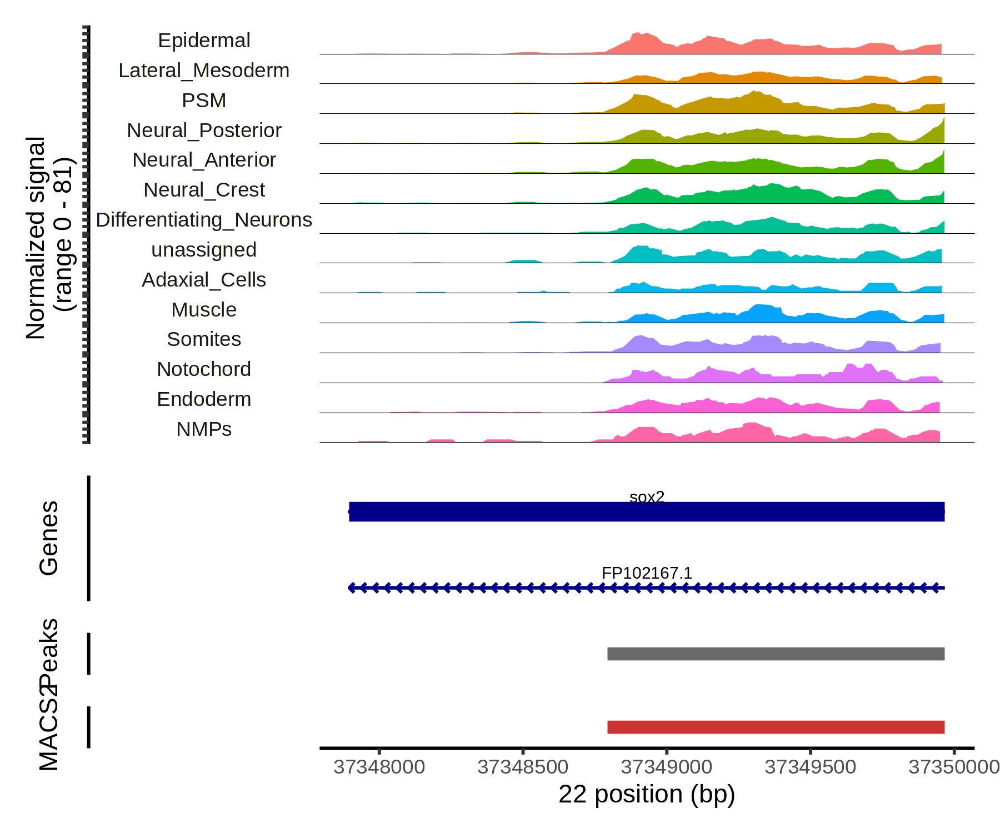

In [448]:
# Compare the called peaks using a Coverage Plot
CoveragePlot(
  object = TDR118,
  region = "sox2",
  ranges = peaks,
  ranges.title = "MACS2"
)

GRanges object with 316881 ranges and 1 metadata column:
           seqnames            ranges strand |         peak_called_in
              <Rle>         <IRanges>  <Rle> |            <character>
       [1]        1         3543-3972      * | Differentiating_Neur..
       [2]        1         4473-6134      * | Lateral_Mesoderm,PSM..
       [3]        1       11016-12944      * | Epidermal,unassigned..
       [4]        1       13368-13579      * |                 Muscle
       [5]        1       14639-15056      * | Neural_Crest,NMPs,Ne..
       ...      ...               ...    ... .                    ...
  [316877]       25 37498216-37498932      * | Neural_Anterior,Musc..
  [316878]       25 37499167-37500024      * | Neural_Anterior,Neur..
  [316879]       25 37501445-37501804      * | Lateral_Mesoderm,End..
  [316880]       MT           28-3549      * | PSM,Neural_Anterior,..
  [316881]       MT       13335-16517      * | Neural_Posterior,Som..
  -------
  seqinfo: 26 sequences

In [532]:
DefaultAssay(TDR118)<-"ATAC"

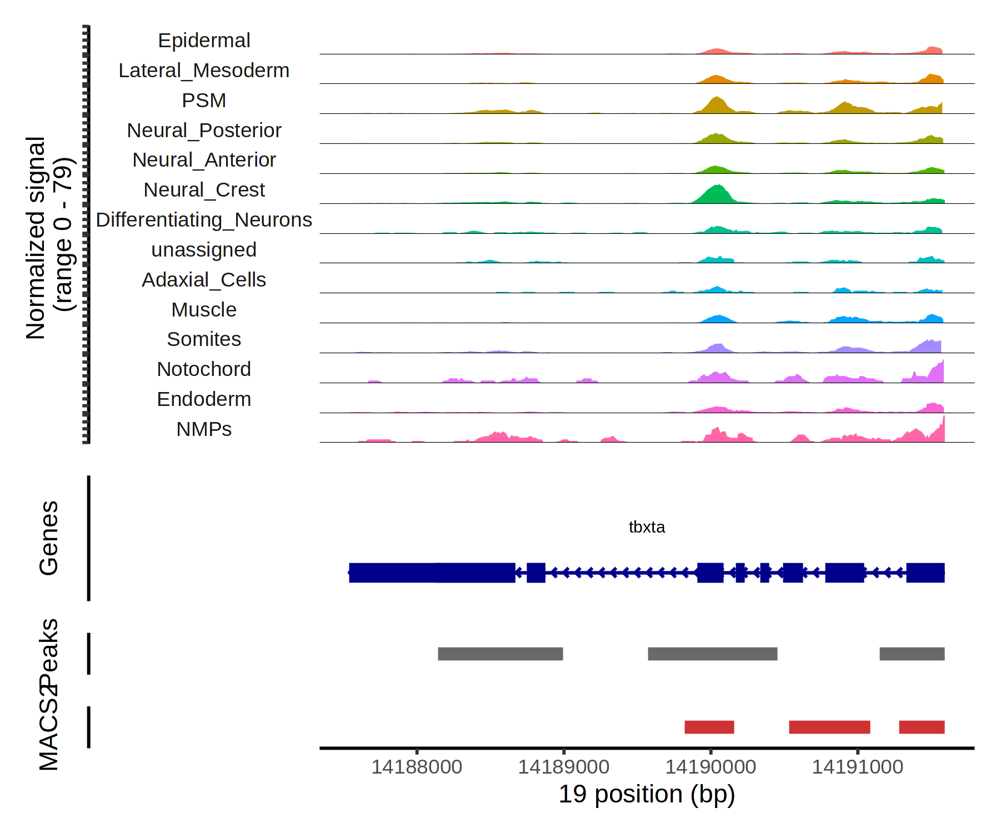

In [533]:
# Compare the called peaks using a Coverage Plot
CoveragePlot(
  object = TDR118,
  region = "tbxta",
  ranges = peaks,
  ranges.title = "MACS2"
)

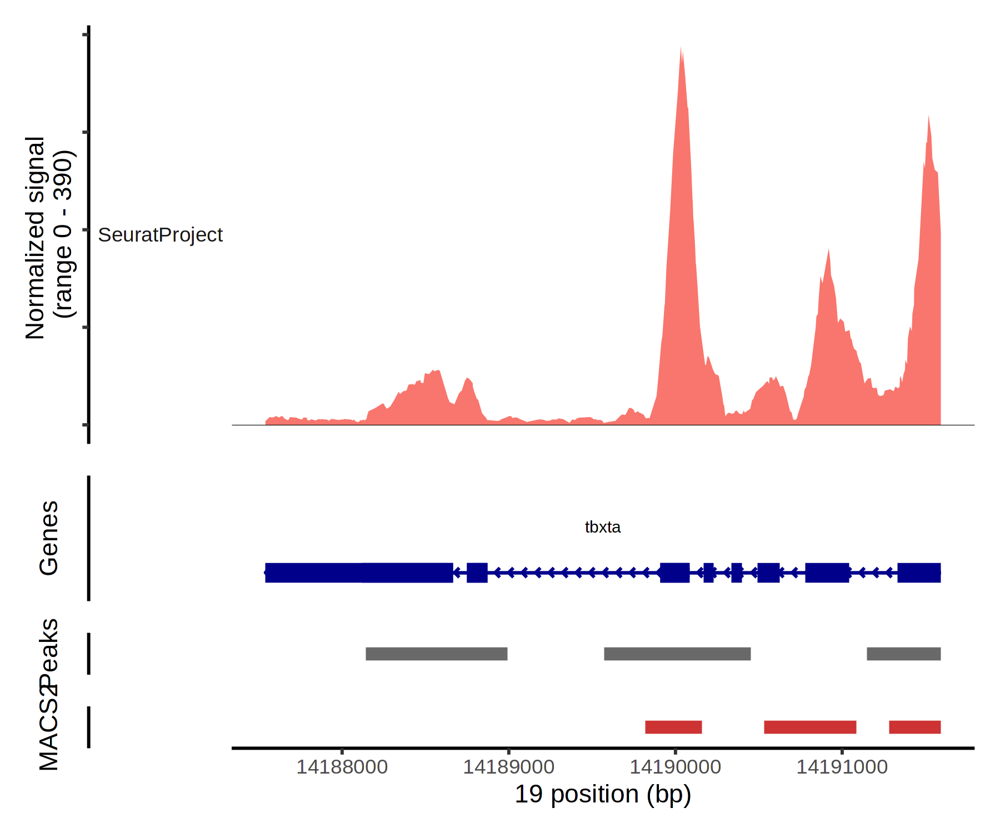

In [536]:
# Compare the called peaks using a Coverage Plot
# change the group.by to "bulk"
Idents(TDR118)<-"orig.ident"

CoveragePlot(
  object = TDR118,
  region = "tbxta",
  ranges = peaks,
  ranges.title = "MACS2"
)

# change the group.by to "predicted.id" (cell-type) again
Idents(TDR118)<-"predicted.id"

In [537]:
TDR118@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,nCount_SCT,⋯,prediction.score.Muscle_myod1,prediction.score.Endothelial_sox7,prediction.score.NMPs_sox2.tbxta,SCT_snn_res.0.5,seurat_clusters,cell_annotation,nCount_peaks_celltype,nFeature_peaks_celltype,SCT.weight,peaks_celltype.weight
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<int>,<dbl>,<dbl>
AAACAGCCACCTAAGC-1,SeuratProject,2731,1273,21425,9781,0.5717067,0.40,4.488213,0.48,2385,⋯,0.0000000,0,0.0000000,6,6,EpidermAnterior_six4b.pitx3,11772,9930,5.000000e-01,0.5000000
AAACAGCCAGGGAGGA-1,SeuratProject,2520,1179,10334,5028,0.4481434,0.13,4.795205,0.75,2285,⋯,0.0000000,0,0.0000000,15,15,LateralPlate_cxcl12a.hand2,5629,5087,5.296907e-01,0.4703093
AAACAGCCATAGACCC-1,SeuratProject,5281,1922,51485,19874,0.5148096,0.24,5.238692,0.92,2625,⋯,0.0000000,0,0.0000000,4,4,PSN_msgn1,28001,19915,9.045735e-05,0.9999095
AAACATGCAAACTCAT-1,SeuratProject,2217,1073,19812,9183,0.6733333,0.85,4.409525,0.41,2165,⋯,0.0000000,0,0.0000000,3,3,SpinalCord.ldlrad2.hoxc3a,10764,9118,4.117140e-01,0.5882860
AAACATGCAAGGACCA-1,SeuratProject,1060,411,5182,2565,0.3936170,0.06,4.939061,0.83,1844,⋯,0.0000000,0,0.0000000,1,1,SpinalCord.ldlrad2.hoxc3a,2769,2547,6.588751e-01,0.3411249
AAACATGCAAGGATTA-1,SeuratProject,1771,902,24072,10949,0.6430380,0.72,4.636479,0.62,1900,⋯,0.0000000,0,0.0000000,0,0,Midbrain_her8.zfhx4,13109,10969,6.148440e-01,0.3851560
AAACATGCACGTTACA-1,SeuratProject,1718,957,25566,12021,0.7326260,0.96,3.919890,0.09,1872,⋯,0.0000000,0,0.0000000,5,5,NeuralCrest_ednrab.slc1a3a,14263,12139,4.698750e-01,0.5301250
AAACATGCAGGACCTT-1,SeuratProject,5604,1682,8685,4214,0.4788360,0.18,4.089459,0.17,2537,⋯,0.0000000,0,0.0000000,4,4,PSN_msgn1,4839,4314,4.332360e-01,0.5667640
AAACATGCAGGCGATA-1,SeuratProject,2106,404,15465,7341,0.6201413,0.61,4.048892,0.15,2076,⋯,0.0000000,0,0.0000000,1,1,OpticCup_rx1,8484,7459,1.878375e-01,0.8121625


In [ ]:
# Peak calling for bulk using MACS2 (to see if we can actually capture the four peaks visually shown above for tbxta)
peaks_bulk <- CallPeaks(object = TDR118, group.by = NULL)
peaks_bulk

In [534]:
pdf(file = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/TDR118_tbxta_coverage_peaks.pdf")

# Compare the called peaks using a Coverage Plot
CoveragePlot(
  object = TDR118,
  region = "tbxta",
  ranges = peaks,
  ranges.title = "MACS2"
)

# Step 3: Run dev.off() to create the file!
dev.off()

png 
  2

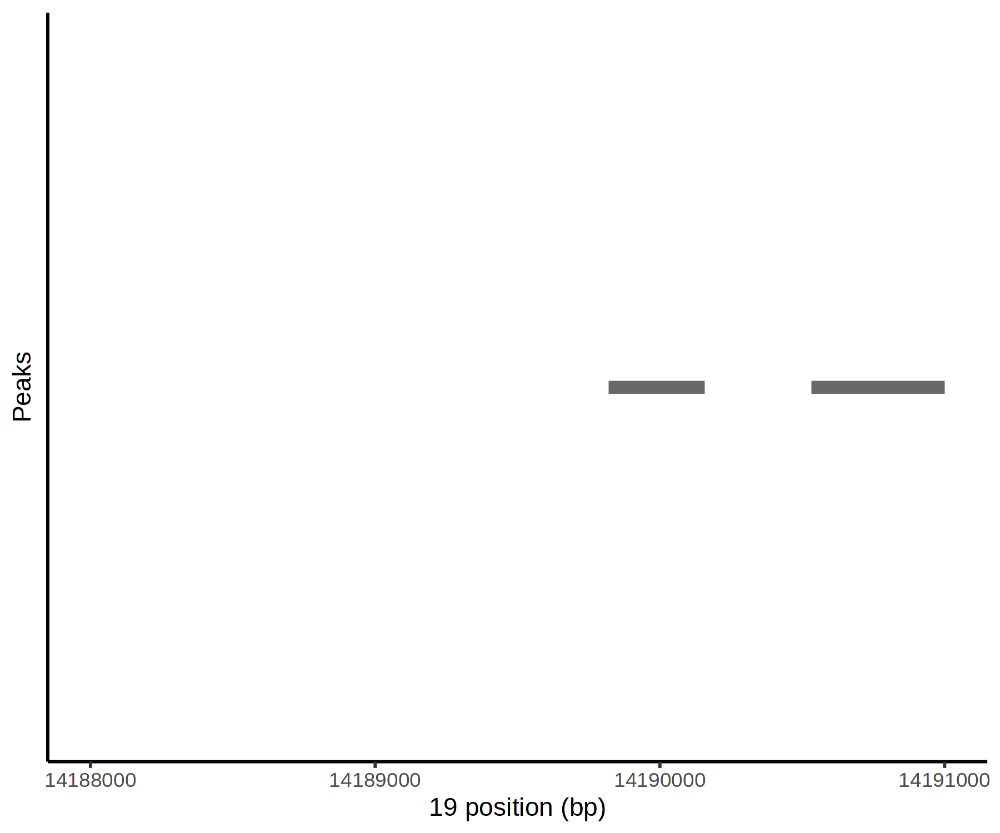

In [531]:
peak_plot2 <- PeakPlot(
  object = TDR118,
  region = "19-14188000-14191000",
  peaks=peaks
)
peak_plot2

In [525]:
TDR118@assays$ATAC@ranges

GRanges object with 248320 ranges and 0 metadata columns:
           seqnames            ranges strand
              <Rle>         <IRanges>  <Rle>
       [1]        1         2372-3057      *
       [2]        1         6507-7253      *
       [3]        1       11485-12198      *
       [4]        1       14475-15248      *
       [5]        1       16516-17393      *
       ...      ...               ...    ...
  [248316]        9 56433462-56434391      *
  [248317]        9 56437053-56437849      *
  [248318]        9 56450898-56451686      *
  [248319]        9 56452315-56452858      *
  [248320]        9 56459068-56459827      *
  -------
  seqinfo: 25 sequences from an unspecified genome; no seqlengths

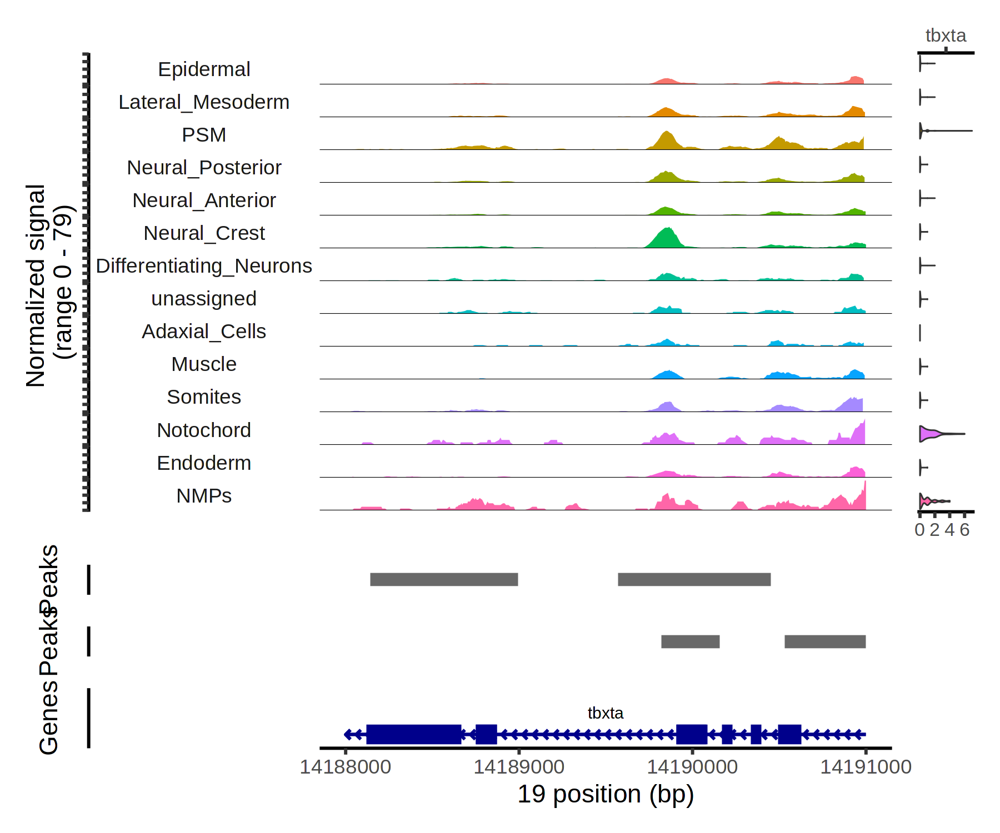

In [528]:
# Compare the called peaks using a Coverage Plot
cov_plot <- CoveragePlot(
  object = TDR118,
  region = "tbxta",
  annotation=FALSE,
  peaks=FALSE
  #ranges = peaks,
  #ranges.title = "MACS2"
)

# gene annotation
gene_plot <- AnnotationPlot(
  object = TDR118,
  region = "19-14188000-14191000"
)
# gene_plot


# cellranger-arc peak
peak_plot1 <- PeakPlot(
  object = TDR118,
  region = "19-14188000-14191000",
  peaks=TDR118@assays$ATAC@ranges
)
# peak_plot

# cell-type-specific peak
peak_plot2 <- PeakPlot(
  object = TDR118,
  region = "19-14188000-14191000",
  peaks=TDR118@assays$peaks_celltype@ranges
)

# expression of RNA
expr_plot <- ExpressionPlot(
  object = TDR118,
  features = "tbxta",
  assay = "RNA"
)


CombineTracks(
  plotlist = list(cov_plot, peak_plot1, peak_plot2, gene_plot),
  expression.plot = expr_plot,
  heights = c(10,1,1,2),
  widths = c(10, 1)
)

In [ ]:
# Compare the called peaks using a Coverage Plot
cov_plot <- CoveragePlot(
  object = TDR118,
  region = "tbxta",
  annotation=FALSE,
  peaks=FALSE
  #ranges = peaks,
  #ranges.title = "MACS2"
)

# gene annotation
gene_plot <- AnnotationPlot(
  object = TDR118,
  region = "19-14188000-14191000"
)
# gene_plot


# cellranger-arc peak
peak_plot1 <- PeakPlot(
  object = TDR118,
  region = "19-14188000-14191000",
  peaks=TDR118@assays$ATAC@ranges
)
# peak_plot

# cell-type-specific peak
peak_plot2 <- PeakPlot(
  object = TDR118,
  region = "19-14188000-14191000",
  peaks=TDR118@assays$peaks_celltype@ranges
)

# expression of RNA
expr_plot <- ExpressionPlot(
  object = TDR118,
  features = "tbxta",
  assay = "RNA"
)


CombineTracks(
  plotlist = list(cov_plot, peak_plot1, peak_plot2, gene_plot),
  expression.plot = expr_plot,
  heights = c(10,1,1,2),
  widths = c(10, 1)
)

In [530]:
pdf(file = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/TDR118_tbxta_coverage.pdf")

tbxta_plot <- CombineTracks(
  plotlist = list(cov_plot, peak_plot1, peak_plot2, gene_plot),
  expression.plot = expr_plot,
  heights = c(10,1,1,2),
  widths = c(10, 1)
)

tbxta_plot


# Step 3: Run dev.off() to create the file!
dev.off()

png 
  2

In [454]:
Idents(TDR118) <- "predicted.id"

In [455]:
table(TDR118@meta.data$predicted.id)


          Adaxial_Cells Differentiating_Neurons                Endoderm 
                    128                     299                     448 
              Epidermal        Lateral_Mesoderm                  Muscle 
                   1447                    1864                     419 
        Neural_Anterior            Neural_Crest        Neural_Posterior 
                   3786                    1004                    1750 
                   NMPs               Notochord                     PSM 
                    103                      76                     730 
                Somites              unassigned 
                    662                     306 

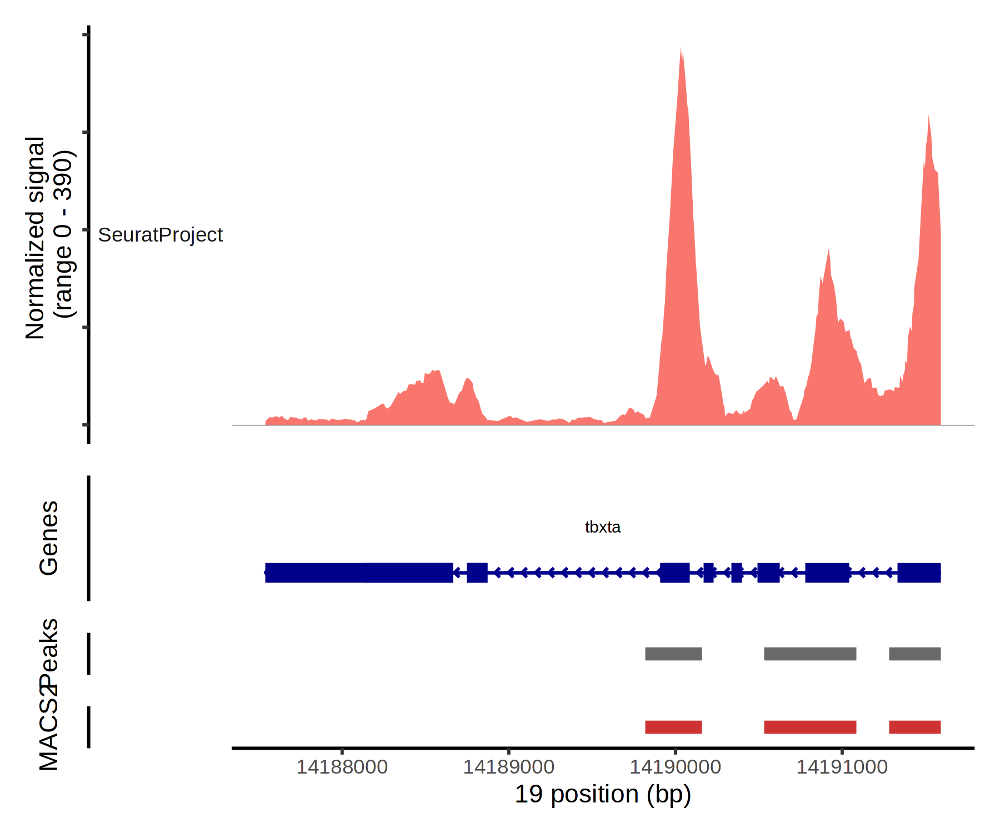

In [452]:
# Compare the called peaks using a Coverage Plot
Idents(TDR118)<-"orig.ident"

CoveragePlot(
  object = TDR118,
  region = "tbxta",
  ranges = peaks,
  ranges.title = "MACS2"
)

In [469]:
# Check for all marker genes from 15 somite stage (marker genes from Merlin Lange)
list_genes = c("lrrc17", "comp", "ripply1", # somite
               "crestin", "ednrab", "dlx2a", # neural crest
               "olig3", "hoxd4a","rxrga", # spinal cord neural tube
               "nid1b",  #head mesenchyme "prrx1"
               "cpox","gata1a", #hematopoietic system "hbbe1"
               "tbx3b","loxl5b",'emilin3a') #notochord
list_genes

[1] "lrrc17"   "comp"     "ripply1"  "crestin"  "ednrab"   "dlx2a"   
 [7] "olig3"    "hoxd4a"   "rxrga"    "nid1b"    "cpox"     "gata1a"  
[13] "tbx3b"    "loxl5b"   "emilin3a"

In [460]:
table(TDR118$predicted.id)


          Adaxial_Cells Differentiating_Neurons                Endoderm 
                    128                     299                     448 
              Epidermal        Lateral_Mesoderm                  Muscle 
                   1447                    1864                     419 
        Neural_Anterior            Neural_Crest        Neural_Posterior 
                   3786                    1004                    1750 
                   NMPs               Notochord                     PSM 
                    103                      76                     730 
                Somites              unassigned 
                    662                     306 

In [461]:
# marker_genes <- read_excel("/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/notebooks/multiome_zebrahub_analysis/marker_genes_15s.xlsx")
# marker_genes

# # chatgpt
# # Read the CSV file into a data frame
# data <- read.csv("your_file.csv")

# # Create an empty list to store the marker genes for each cell type
# marker_genes <- list()

# # Loop through unique cell types and collect marker genes
# unique_cell_types <- unique(data$cell_type)
# for (cell_type in unique_cell_types) {
#   # Subset the data for the current cell type
#   subset_data <- data[data$cell_type == cell_type, ]
  
#   # Extract the marker genes for the current cell type
#   current_marker_genes <- subset_data$marker_genes
  
#   # Assign the marker genes to the corresponding cell type in the list
#   marker_genes[[cell_type]] <- current_marker_genes
# }

# # Print the dictionary-like structure
# print(marker_genes)

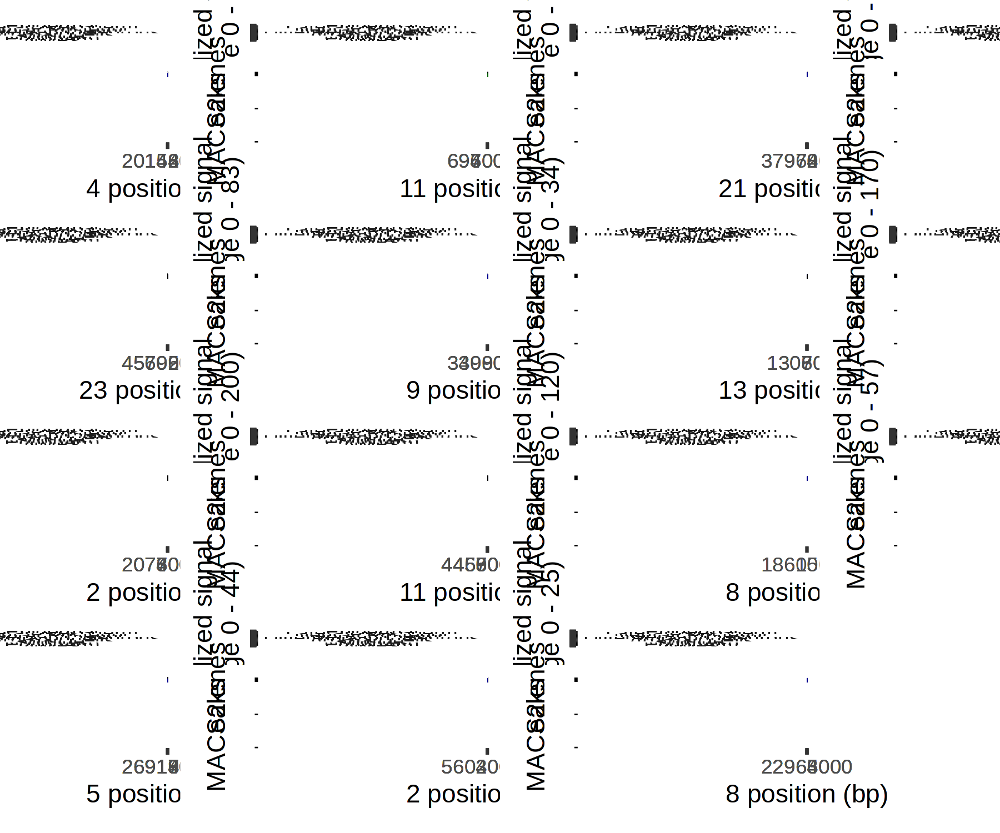

In [470]:
# Default assay - ATAC (such that we can have cellrager-arc peaks as well)

# create an empty list to store coverage plots
coverage_plots <- list()

# iterate over each marker gene
for (gene in list_genes){
    # generate the CoveragePlot for the current gene
    plot <- CoveragePlot(
      object = TDR118,
      region = gene,
      ranges = peaks,
      ranges.title = "MACS2")
    
    # add the plot to the list
    coverage_plots[[gene]] <- plot
}

# # combine the CoveragePlots into a patchwork grid (4x4)
# patchwork_plots <- wrap_plots(coverage_plots, ncol=4)

# # display the patchwork of CoveragePlots
# patchwork_plots

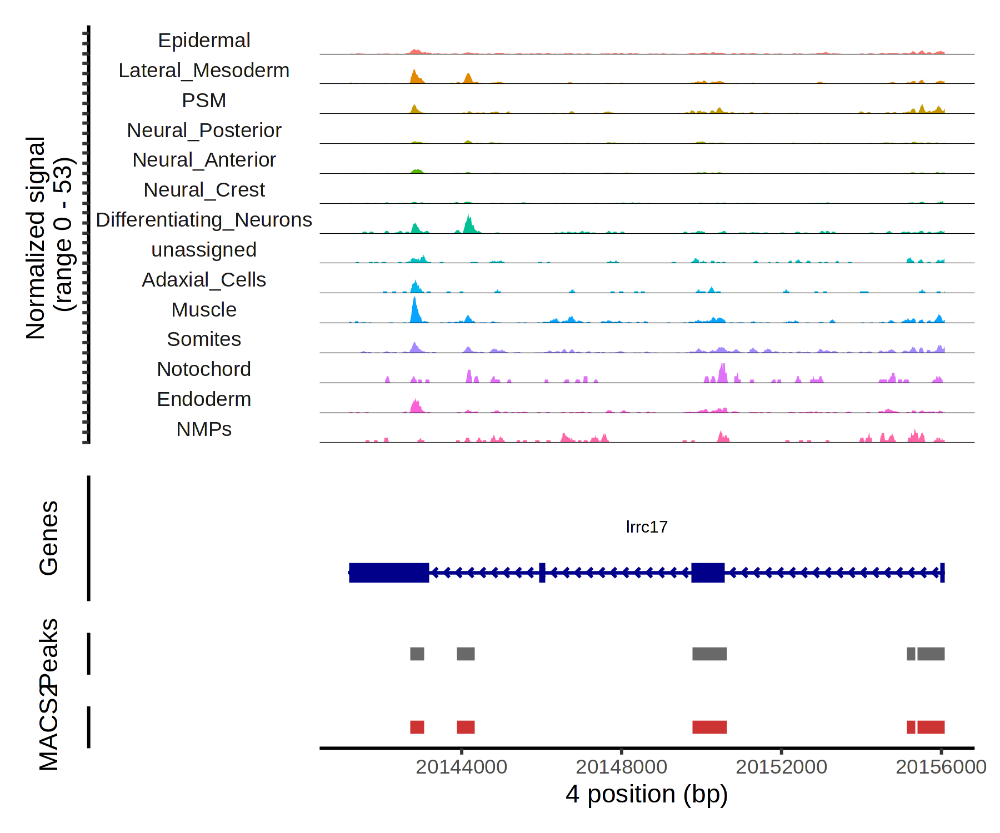

In [471]:
coverage_plots[["lrrc17"]]

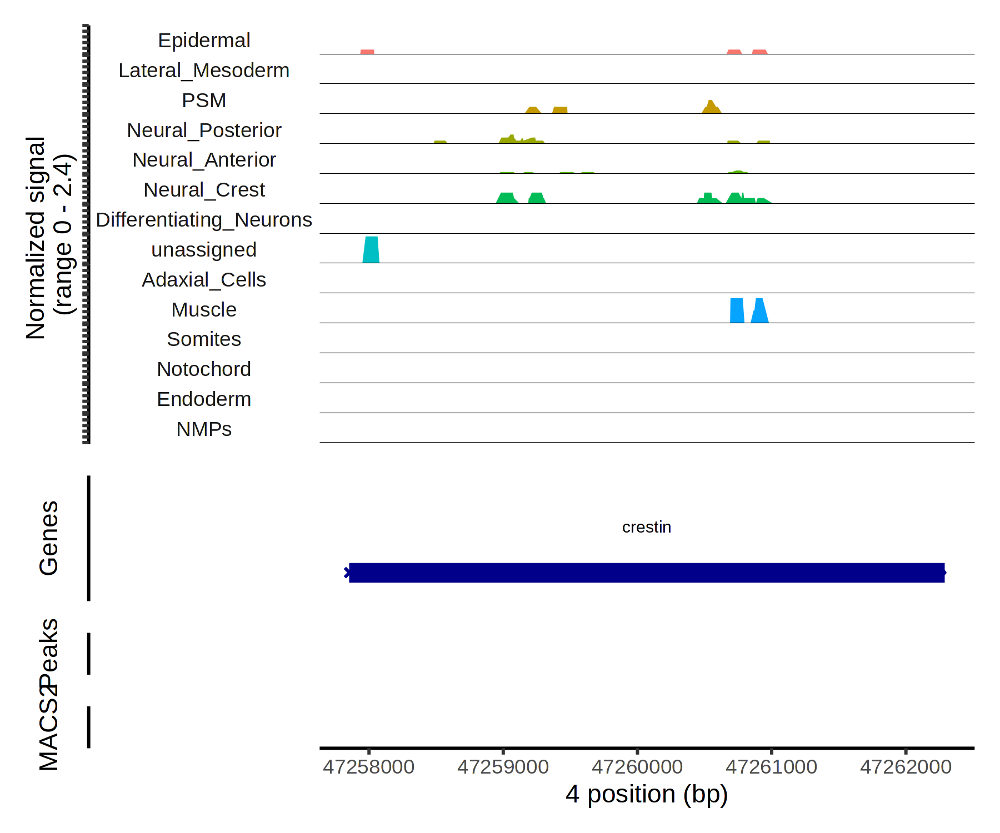

In [472]:
coverage_plots[["crestin"]]

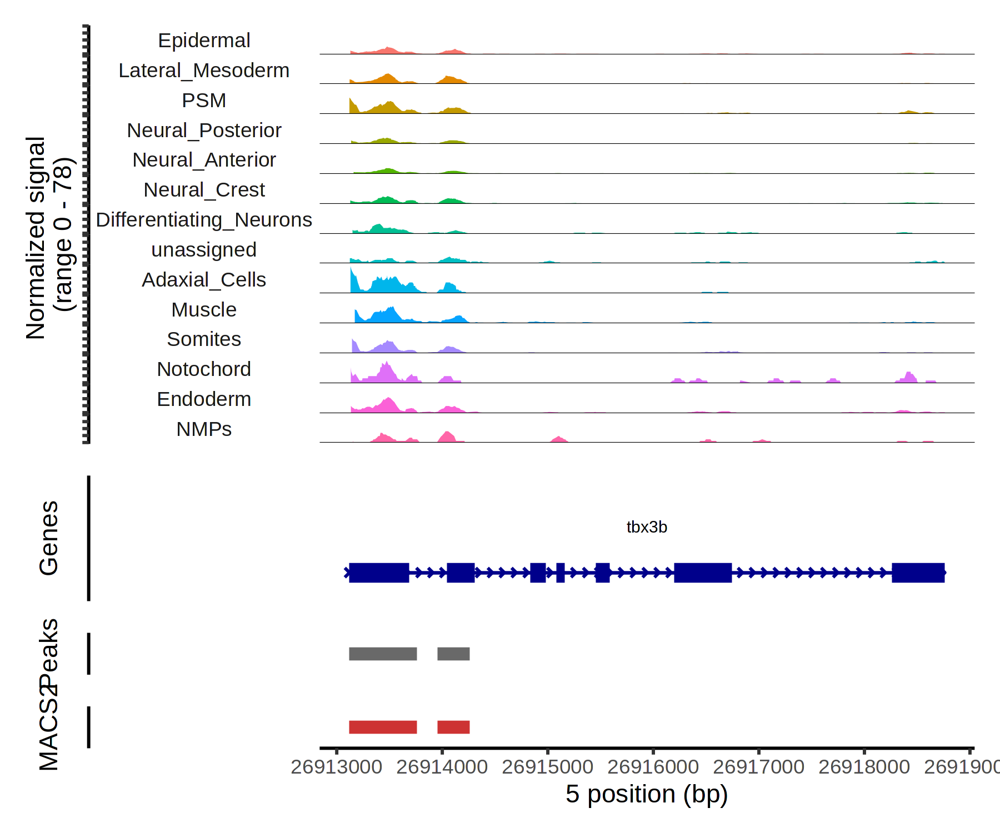

In [474]:
coverage_plots[["tbx3b"]]

In [468]:
for (gene in list_genes){
    # Check if the gene is present in the annotation
    is_present <- gene %in% annotation$gene_name

    # Print the result
    if (is_present) {
      cat(paste(gene, "is present in the annotation.\n"))
    } else {
      cat(paste(gene, "is not present in the annotation.\n"))
    }
}

lrrc17 is present in the annotation.
comp is present in the annotation.
ripply1 is present in the annotation.
crestin is present in the annotation.
ednrab is present in the annotation.
dlx2a is present in the annotation.
olig3 is present in the annotation.
hoxd4a is present in the annotation.
rxrga is present in the annotation.
prrx1 is not present in the annotation.
nid1b is present in the annotation.
cpox is present in the annotation.
gata1a is present in the annotation.
hbbe1 is not present in the annotation.
tbx3b is present in the annotation.
loxl5b is present in the annotation.
emilin3a is present in the annotation.


In [465]:
annotation$gene_name

[1] "ptpn12"             "ptpn12"             "ptpn12"            
    [4] "ptpn12"             "ptpn12"             "ptpn12"            
    [7] "ptpn12"             "ptpn12"             "ptpn12"            
   [10] "ptpn12"             "phtf2"              "phtf2"             
   [13] "phtf2"              "phtf2"              "phtf2"             
   [16] "phtf2"              "phtf2"              "phtf2"             
   [19] "phtf2"              "phtf2"              "phtf2"             
   [22] "phtf2"              "phtf2"              "phtf2"             
   [25] "phtf2"              "phtf2"              "phtf2"             
   [28] "phtf2"              "phtf2"              "phtf2"             
   [31] "phtf2"              "phtf2"              "phtf2"             
   [34] "phtf2"              "phtf2"              "phtf2"             
   [37] "phtf2"              "phtf2"              "phtf2"             
   [40] "phtf2"              "phtf2"              "phtf2"             
   [43] "phtf2"              "phtf2"              "phtf2"             
   [46] "phtf2"              "phtf2"              "phtf2"             
   [49] "phtf2"              "phtf2"              "phtf2"             
   [52] "phtf2"              "phtf2"              "phtf2"             
   [55] "phtf2"              "phtf2"              "phtf2"             
   [58] "phtf2"              "phtf2"              "phtf2"             
   [61] "phtf2"              "phtf2"              "phtf2"             
   [64] "phtf2"              "phtf2"              "phtf2"             
   [67] "phtf2"              "phtf2"              "phtf2"             
   [70] "phtf2"              "phtf2"              "phtf2"             
   [73] "phtf2"              "phtf2"              "phtf2"             
   [76] "phtf2"              "phtf2"              "phtf2"             
   [79] "phtf2"              "phtf2"              "phtf2"             
   [82] "phtf2"              "phtf2"              "phtf2"             
   [85] "phtf2"              "phtf2"              "phtf2"             
   [88] "phtf2"              "phtf2"              "phtf2"             
   [91] "phtf2"              "phtf2"              "phtf2"             
   [94] "phtf2"              "phtf2"              "phtf2"             
   [97] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [100] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [103] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [106] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [109] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [112] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [115] "CU856344.1"         "CU856344.1"         "CU856344.1"        
  [118] "CU856344.1"         "CU856344.1"         "si:zfos-932h1.3"   
  [121] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [124] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [127] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [130] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [133] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [136] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [139] "si:zfos-932h1.3"    "si:zfos-932h1.3"    "si:zfos-932h1.3"   
  [142] "si:zfos-932h1.3"    "mansc1"             "mansc1"            
  [145] "mansc1"             "mansc1"             "mansc1"            
  [148] "mansc1"             "mansc1"             "mansc1"            
  [151] "mansc1"             "mansc1"             "mansc1"            
  [154] "lrp6"               "lrp6"               "lrp6"              
  [157] "lrp6"               "lrp6"               "lrp6"              
  [160] "lrp6"               "lrp6"               "lrp6"              
  [163] "lrp6"               "lrp6"               "lrp6"              
  [166] "lrp6"               "lrp6"               "lrp6"              
  [169] "lrp6"              

In [485]:
TDR118

An object of class Seurat 
619951 features across 13022 samples within 4 assays 
Active assay: peaks_celltype (316881 features, 316880 variable features)
 3 other assays present: RNA, ATAC, SCT
 8 dimensional reductions calculated: pca, umap, lsi, atac.umap, wnn.umap, umap.pca30, lsi.cellranger, atac.umap.cellranger

In [24]:
# # Choose a set of peaks from the above Coverage Plot, then create a new object to replace the original ATAC object

# peaks <- peaks_coarse

# # remove peaks on nonstandard chromosomes and in genomic blacklist regions
# peaks <- keepStandardChromosomes(peaks, pruning.mode = "coarse")
# peaks <- subsetByOverlaps(x = peaks, ranges = blacklist_hg38_unified, invert = TRUE)

# # quantify counts in each peak
# macs2_counts <- FeatureMatrix(
#   fragments = Fragments(pbmc),
#   features = peaks,
#   cells = colnames(pbmc)
# )

# # create a new assay using the MACS2 peak set and add it to the Seurat object
# pbmc[["peaks"]] <- CreateChromatinAssay(
#   counts = macs2_counts,
#   fragments = fragpath,
#   annotation = annotation
# )

Extracting reads overlapping genomic regions

Computing hash



### IMPORTANT:

A nice vignette on generating Coverage plots (peaks, averaged reads across cells per cell type, genomic links, and genomic regions with annotation):

https://stuartlab.org/signac/articles/visualization.html

# [Already done] Step 4. ATAC data processing (for the "peaks" chosen from the above)

(link: https://stuartlab.org/signac/articles/pbmc_vignette.html)

Tasks:
- Filtering out low-quality cells using QC metrics 
- Dim reduction, computing the embedding

## Chromatin accessibility (ATAC) data processing

Here we process the DNA accessibility assay the same way we would process a scATAC-seq dataset, by performing latent semantic indexing (LSI).

In [25]:
# # change the default assay to "peaks" (cell-type-specifically called peaks)
# DefaultAssay(pbmc) <- "peaks"
# pbmc <- FindTopFeatures(pbmc, min.cutoff = 5)
# pbmc <- RunTFIDF(pbmc)
# pbmc <- RunSVD(pbmc)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings



# [Already done] Step 5. Compute the joint embedding (weighted nearest neighbor)

In [486]:
# # First, we will compute the UMAPs from individual modalities
# # RNA
# pbmc <- RunUMAP(pbmc, reduction = 'pca', dims = 1:50, assay = 'SCT', 
#               reduction.name = 'rna.umap', reduction.key = 'rnaUMAP_')
# # ATAC
# pbmc <- RunUMAP(pbmc, reduction = 'lsi', dims = 2:40, assay = 'peaks', 
#               reduction.name = 'atac.umap', reduction.key = 'atacUMAP_')


In [487]:
# # Then, let's compute the weighted nearest neighbors and a joint embedding (UMAP)
# pbmc <- FindMultiModalNeighbors(pbmc,reduction.list = list("pca", "lsi"), dims.list = list(1:50, 2:40))
# pbmc <- RunUMAP(pbmc, nn.name = "weighted.nn", n.neighbors = 30, 
#                 reduction.name = "wnn.umap", reduction.key = "wnnUMAP_")
# pbmc <- FindClusters(pbmc, graph.name = "wsnn", algorithm = 4, verbose = FALSE)

# DimPlot(pbmc, label = TRUE, repel = TRUE, reduction = "wnn.umap") + NoLegend()

In [488]:
# DimPlot(pbmc, label = TRUE, repel = TRUE, reduction = "wnn.umap", group.by="predicted.id") + NoLegend()

## (Optional) Curation of annotation in exCellxgene 

- convert the Seurat object to anndata for this

In [489]:
# save the seurat object, pbmc
SaveH5Seurat(object = TDR118, filename = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/TDR118_processed.h5Seurat")


Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding counts for ATAC

Adding data for ATAC

Adding variable features for ATAC

Adding feature-level metadata for ATAC

Writing out ranges for ATAC

Writing out motifs for ATAC

Writing out fragments for ATAC

Writing out seqinfo for ATAC

Writing out annotation for ATAC

Writing out bias for ATAC

Writing out positionEnrichment for ATAC

Writing out links for ATAC

Adding counts for SCT

Adding data for SCT

Adding scale.data for SCT

Adding variable features for SCT

No feature-level metadata found for SCT

Writing out SCTModel.list for SCT

Adding counts for peaks_celltype

Adding data for peaks_celltype

Adding variable features for peaks_celltype

Adding feature-level metadata for peaks_celltype

Writing out ranges for peaks_celltype

Writing out motifs for peaks_celltype

Writing out fragments for peaks_celltype



# [Skipped] Step 6. Compute the gene-peak linkage

**Note - the gene-peak correlation can be better quantified in MetaCells (i.e. SEACells), so we will just skip this part.**

Signac: For each gene, we can find the set of peaks that may regulate the gene by computing the correlation between gene expression and accessibility at nearby peaks, and correcting for bias due to GC content, overall accessibility, and peak size. See the Signac paper for a full description of the method we use to link peaks to genes.

Running this step on the whole genome can be time consuming, so here we demonstrate peak-gene links for a subset of genes as an example. The same function can be used to find links for all genes by omitting the genes.use parameter:

In [499]:
DefaultAssay(TDR118) <- "peaks_celltype"

# first compute the GC content for each peak
TDR118 <- RegionStats(TDR118, genome = BSgenome.Drerio.UCSC.danRer11)

# link peaks to genes
TDR118 <- LinkPeaks(
  object = TDR118,
  peak.assay = "peaks_celltype",
  expression.assay = "SCT",
  gene.coords = gene.coords.zf,
  genes.use = c("tbxta", "sox2")
)

Testing 2 genes and 316828 peaks



ERROR: Error in density.default(x = query.feature[[featmatch]], kernel = "gaussian", : argument 'x' must be numeric


# Step 7. DA peaks and TF motif enrichment

This is still an open problem in scATAC-seq field.
We will try a couple of methods here.

- Signac (Cicero, ChromeVar)
vignette - Motif analysis with Signac: https://stuartlab.org/signac/articles/motif_vignette.html



- CellOracle - Sam Morris lab
CellOracle: Systematic TF KO simulations in zebrafish
Next, we applied CellOracle to systematically perturb TFs across zebrafish development. We made use of a 38,731-cell atlas of zebrafish embryogenesis published in a study by Farrell et al.32, comprising 25 developmental trajectories that span zygotic genome activation to early somitogenesis. We first inferred GRN configurations for the 38 cell types and states identified in the Farrell et al. study32, splitting the main branching trajectory into four sub-branches: ectoderm; axial mesoderm; other mesendoderm; and germ layer branching point (Extended Data Fig. 10a,b). In the absence of scATAC-seq data, we constructed a base GRN using promoter information from the UCSC database, obtaining information on TF-binding motifs from the Danio rerio CisBP motif database (Methods). Our benchmarking has shown that this approach produces reliable GRN inference (Extended Data Fig. 2). After preprocessing and GRN inference, we performed KO simulations for all TFs with inferred connections to at least one other gene (n = 232 ‘active’ TFs; Methods). The results of these simulations across all developmental trajectories can be explored at https://www.celloracle.org.
(Note that CellOracle is a python package).


In [502]:
library(JASPAR2020)
library(TFBSTools)
library(patchwork)




Attaching package: ‘TFBSTools’


The following object is masked from ‘package:Matrix’:

    Matrix




## Adding motif information to the Seurat object

To add the DNA sequence motif information required for motif analyses, we can run the AddMotifs() function:

In [505]:
JASPAR2020

An object of class "JASPAR2020"
Slot "db":
[1] "/usr/local/lib/R/site-library/JASPAR2020/extdata/JASPAR2020.sqlite"


In [503]:
# Get a list of motif position frequency matrices from the JASPAR database
pfm <- getMatrixSet(
  x = JASPAR2020,
  opts = list(collection = "CORE", tax_group = 'vertebrates', all_versions = FALSE)
)

# add motif information
TDR118 <- AddMotifs(
  object = TDR118,
  genome = BSgenome.Drerio.UCSC.danRer11,
  pfm = pfm
)

Building motif matrix



ERROR: Error in dimnamesGets(x, value): length of Dimnames[[1]] (1) is not equal to Dim[1] (0)


To facilitate motif analysis in Signac, we have created the Motif class to store all the required information, including a list of position weight matrices (PWMs) or position frequency matrices (PFMs) and a motif occurrence matrix. Here, the AddMotifs() function constructs a Motif object and adds it to our mouse brain dataset, along with other information such as the base composition of each peak. A motif object can be added to any Seurat assay using the SetAssayData() function. See the object interaction vignette for more information.

## Finding overrepresented motifs

signac: To identify potentially important cell-type-specific regulatory sequences, we can search for DNA motifs that are overrepresented in a set of peaks that are differentially accessible between cell types.

Here, we find differentially accessible peaks between CD4 T cells and CD8 T cells. 
For sparse data (such as scATAC-seq), we find it is often necessary to lower the min.pct threshold in FindMarkers() from the default (0.1, which was designed for scRNA-seq data).

We then perform a hypergeometric test to test the probability of observing the motif at the given frequency by chance, comparing with a background set of peaks matched for GC content.

In [74]:
pbmc@assays

$RNA
Assay data with 36601 features for 11331 cells
First 10 features:
 MIR1302-2HG, FAM138A, OR4F5, AL627309.1, AL627309.3, AL627309.2,
AL627309.5, AL627309.4, AP006222.2, AL732372.1 

$ATAC
ChromatinAssay data with 108377 features for 11331 cells
Variable features: 0 
Genome: 
Annotation present: TRUE 
Motifs present: FALSE 
Fragment files: 1 

$SCT
SCTAssay data with 24470 features for 11331 cells, and 1 SCTModel(s) 
Top 10 variable features:
 GNLY, IGKC, IGHM, PTGDS, BANK1, IGLC3, TCF4, SOX5, JCHAIN, IGLC2 

$peaks
ChromatinAssay data with 151567 features for 11331 cells
Variable features: 151443 
Genome: 
Annotation present: TRUE 
Motifs present: TRUE 
Fragment files: 1 


## Note on the DA (Differentially Accessible) peaks computation

argument in FindMarkers:

- test.use

Denotes which test to use. Available options are:

- "wilcox" : Identifies differentially expressed genes between two groups of cells using a Wilcoxon Rank Sum test (default)

- "bimod" : Likelihood-ratio test for single cell gene expression, (McDavid et al., Bioinformatics, 2013)

- "roc" : Identifies 'markers' of gene expression using ROC analysis. For each gene, evaluates (using AUC) a classifier built on that gene alone, to classify between two groups of cells. An AUC value of 1 means that expression values for this gene alone can perfectly classify the two groupings (i.e. Each of the cells in cells.1 exhibit a higher level than each of the cells in cells.2). An AUC value of 0 also means there is perfect classification, but in the other direction. A value of 0.5 implies that the gene has no predictive power to classify the two groups. Returns a 'predictive power' (abs(AUC-0.5) * 2) ranked matrix of putative differentially expressed genes.

- "t" : Identify differentially expressed genes between two groups of cells using the Student's t-test.

- "negbinom" : Identifies differentially expressed genes between two groups of cells using a negative binomial generalized linear model. Use only for UMI-based datasets

- "poisson" : Identifies differentially expressed genes between two groups of cells using a poisson generalized linear model. Use only for UMI-based datasets

- "LR" : Uses a logistic regression framework to determine differentially expressed genes. Constructs a logistic regression model predicting group membership based on each feature individually and compares this to a null model with a likelihood ratio test.

- "MAST" : Identifies differentially expressed genes between two groups of cells using a hurdle model tailored to scRNA-seq data. Utilizes the MAST package to run the DE testing.

- "DESeq2" : Identifies differentially expressed genes between two groups of cells based on a model using DESeq2 which uses a negative binomial distribution (Love et al, Genome Biology, 2014).This test does not support pre-filtering of genes based on average difference (or percent detection rate) between cell groups. However, genes may be pre-filtered based on their minimum detection rate (min.pct) across both cell groups. To use this method, please install DESeq2, using the instructions at https://bioconductor.org/packages/release/bioc/html/DESeq2.html

In [75]:
# Set the default annotation label (This part is not as straightforward as scanpy)
# Here, we will choose the "predict.id"
Idents(pbmc) <- pbmc@meta.data$predicted.id.coarse

# find the differnetially accessible peaks using "FindMarkers" (DGE function in Seurat)
da_peaks <- FindMarkers(
  object = pbmc,
  ident.1 = 'CD4 T',
  ident.2 = 'CD8 T',
  only.pos = TRUE,
  test.use = 'LR',
  min.pct = 0.05,
  latent.vars = 'nCount_peaks'
)

# get top differentially accessible peaks
top.da.peak <- rownames(da_peaks[da_peaks$p_val < 0.005, ])

In [76]:
top.da.peak

[1] "chr1-234408392-234409658"  "chr2-112181378-112183044" 
   [3] "chr2-9781830-9782674"      "chr2-147449208-147450101" 
   [5] "chr21-45642423-45644286"   "chr10-4825470-4826865"    
   [7] "chr8-42154091-42154496"    "chr11-67884111-67885357"  
   [9] "chr11-3511417-3512663"     "chr21-36288386-36289672"  
  [11] "chr4-122577878-122579065"  "chr8-42154812-42155219"   
  [13] "chr4-86593740-86595367"    "chr8-38362561-38363782"   
  [15] "chr9-37528613-37529580"    "chr7-70787508-70788729"   
  [17] "chr6-33668475-33669344"    "chr10-5291420-5292665"    
  [19] "chr16-79598809-79601618"   "chr4-139554937-139557423" 
  [21] "chr19-50328661-50329682"   "chr6-138455301-138456599" 
  [23] "chr8-94959948-94960983"    "chr6-167119300-167120267" 
  [25] "chr10-110355918-110357165" "chr6-161076081-161076818" 
  [27] "chr7-70778398-70779686"    "chr20-52974100-52974495"  
  [29] "chr1-57306909-57307857"    "chr11-35039955-35040908"  
  [31] "chr1-154464735-154465435"  "chr3-32963699-32964321"   
  [33] "chr14-31944181-31945420"   "chr5-9545829-9546532"     
  [35] "chr6-166950937-166951579"  "chr17-59782825-59783515"  
  [37] "chr1-1216632-1217392"      "chr10-33150390-33151696"  
  [39] "chr4-142565600-142566273"  "chr5-56638405-56639808"   
  [41] "chr3-101518043-101518809"  "chr5-758859-759537"       
  [43] "chr2-55530110-55531125"    "chr12-6789083-6789726"    
  [45] "chr6-167113786-167114837"  "chr10-60727683-60728404"  
  [47] "chr9-37531495-37532230"    "chr10-5293649-5294370"    
  [49] "chr2-112187518-112188648"  "chr13-108342074-108343246"
  [51] "chr2-206530466-206531207"  "chr7-44633064-44634147"   
  [53] "chrX-41382794-41384475"    "chr4-89929343-89930082"   
  [55] "chr11-71710130-71711364"   "chr10-61992047-61994408"  
  [57] "chr2-147297516-147298200"  "chr20-13220034-13222113"  
  [59] "chr2-64213642-64214922"    "chr10-3874638-3876157"    
  [61] "chr12-12474438-12475581"   "chr12-12008985-12011035"  
  [63] "chr5-32531306-32532610"    "chr20-13230588-13231709"  
  [65] "chr3-13879366-13880875"    "chr12-110589842-110591361"
  [67] "chr6-149494631-149495717"  "chr3-42638054-42639155"   
  [69] "chr10-62050843-62051407"   "chr5-157544330-157544950" 
  [71] "chr7-74569216-74570108"    "chr13-108495386-108496877"
  [73] "chr5-56479705-56482774"    "chr3-129481607-129482363" 
  [75] "chr16-79639596-79641089"   "chr13-99314246-99315265"  
  [77] "chr12-12467236-12468135"   "chr6-167053690-167054617" 
  [79] "chr4-86544175-86545206"    "chr21-45606925-45607822"  
  [81] "chr22-46660419-46661756"   "chr1-6459635-6460922"     
  [83] "chr10-35011480-35012240"   "chr6-161079695-161080602" 
  [85] "chr4-128802852-128804193"  "chr12-6790600-6791072"    
  [87] "chr6-166942481-166943121"  "chr20-52971988-52972688"  
  [89] "chrX-57286276-57287194"    "chr3-7876538-7877300"     
  [91] "chr1-239501487-239502337"  "chr8-42245364-42246433"   
  [93] "chr14-64755522-64756306"   "chr5-157603196-157603738" 
  [95] "chr16-17396432-17397738"   "chr4-153152899-153154270" 
  [97] "chr20-21547905-21548956"   "chr10-103677679-103678582"
  [99] "chr11-128839977-128840538" "chr6-142773318-142774516" 
 [101] "chr8-124261401-124263447"  "chr16-79770024-79770878"  
 [103] "chr12-8953779-8954502"     "chr10-60732205-60733683"  
 [105] "chr3-32960485-32961532"    "chr12-22334412-22335864"  
 [107] "chr22-46673740-46675062"   "chr12-12456165-12457055"  
 [109] "chr1-193457125-193458039"  "chr2-222423646-222425557" 
 [111] "chr4-7854380-7855468"      "chr10-33114353-33114804"  
 [113] "chr19-11091498-11092495"   "chr8-141072815-141073685" 
 [115] "chr20-36998433-36999362"   "chr4-52588577-52589458"   
 [117] "chr2-100104343-100105450"  "chr1-203682082-203683100" 
 [119] "chr8-140790420-140791772"  "chr4-142703731-142704355" 
 [121] "chr20-21557065-21557991"   "chr6-149507983-149508875" 
 [123] "chr1-213670049-213670904"  "chr2-109143525-109144879" 
 [125] "chr1-111723189-111723820"  "chr19-49896634-49898146"  
 [127] "chr12-117874846-117876341"

## (Optional) Choosing a set of background peaks 


Matching the set of background peaks is essential when finding enriched DNA sequence motifs. By default, we choose a set of peaks matched for GC content, but it can be sometimes be beneficial to further restrict the background peaks to those that are accessible in the groups of cells compared when finding differentially accessible peaks.

The AccessiblePeaks() function can be used to find a set of peaks that are open in a subset of cells. We can use this function to first restrict the set of possible background peaks to those peaks that were open in the set of cells compared in FindMarkers(), and then create a GC-content-matched set of peaks from this larger set using MatchRegionStats().

In [77]:
# find peaks open in Pvalb or Sst cells
open.peaks <- AccessiblePeaks(pbmc, idents = c("CD4 T", "CD8 T"))

# match the overall GC content in the peak set
meta.feature <- GetAssayData(pbmc, assay = "peaks", slot = "meta.features")
peaks.matched <- MatchRegionStats(
  meta.feature = meta.feature[open.peaks, ],
  query.feature = meta.feature[top.da.peak, ],
  n = 50000
)

Matching GC.percent distribution



In [83]:
# test enrichment
enriched.motifs <- FindMotifs(
  object = pbmc,
  features = top.da.peak
)

enriched.motifs

Selecting background regions to match input sequence characteristics

Matching GC.percent distribution

Testing motif enrichment in 3164 regions



,motif,observed,background,percent.observed,percent.background,fold.enrichment,pvalue,motif.name,p.adjust
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
MA0599.1,MA0599.1,1385,7934,43.77370,19.8350,2.206892,2.440657e-226,KLF5,1.820730e-223
MA0039.4,MA0039.4,1432,8428,45.25917,21.0700,2.148038,6.682169e-224,KLF4,2.492449e-221
MA1653.1,MA1653.1,1305,7344,41.24526,18.3600,2.246474,9.555743e-217,ZNF148,2.376195e-214
MA1513.1,MA1513.1,803,3353,25.37927,8.3825,3.027649,9.377173e-202,KLF15,1.748843e-199
MA1564.1,MA1564.1,944,4442,29.83565,11.1050,2.686686,2.389096e-201,SP9,3.564531e-199
MA0746.2,MA0746.2,982,4839,31.03666,12.0975,2.565543,5.752679e-195,SP3,7.152498e-193
MA0741.1,MA0741.1,1051,5626,33.21745,14.0650,2.361710,9.110583e-182,KLF16,9.709279e-180
MA0162.4,MA0162.4,800,3576,25.28445,8.9400,2.828238,8.277903e-181,EGR1,7.719144e-179
MA1522.1,MA1522.1,1112,6235,35.14539,15.5875,2.254716,8.334160e-178,MAZ,6.908092e-176


In [84]:
## Matching GC.percent distribution
# peaks.matched can then be used as the background peak set by setting background=peaks.matched in FindMotifs().

# test enrichment
enriched.motifs.bg_corrected <- FindMotifs(
  object = pbmc,
  features = top.da.peak, 
  background=peaks.matched
)

enriched.motifs.bg_corrected

Testing motif enrichment in 3164 regions



,motif,observed,background,percent.observed,percent.background,fold.enrichment,pvalue,motif.name,p.adjust
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
MA0599.1,MA0599.1,1385,12667,43.77370,25.334,1.727864,1.445545e-120,KLF5,1.078377e-117
MA0039.4,MA0039.4,1432,13472,45.25917,26.944,1.679749,9.285897e-116,KLF4,3.463640e-113
MA1653.1,MA1653.1,1305,11861,41.24526,23.722,1.738692,4.808047e-113,ZNF148,1.195601e-110
MA1564.1,MA1564.1,944,7624,29.83565,15.248,1.956693,3.679185e-103,SP9,6.861680e-101
MA0746.2,MA0746.2,982,8126,31.03666,16.252,1.909713,1.012296e-101,SP3,1.510346e-99
MA1513.1,MA1513.1,803,6097,25.37927,12.194,2.081291,9.149846e-99,KLF15,1.137631e-96
MA0741.1,MA0741.1,1051,9245,33.21745,18.490,1.796509,1.371940e-93,KLF16,1.462096e-91
MA1522.1,MA1522.1,1112,10060,35.14539,20.120,1.746789,1.469775e-92,MAZ,1.370565e-90
MA0162.4,MA0162.4,800,6267,25.28445,12.534,2.017269,2.426354e-91,EGR1,2.011178e-89


The result is "enriched.motif" dataframe, with motif name (TF name), percent of observation, background, fold-enrichment, as well as p-values.

-> See Signac paper's notebooks for which values the authors picked for plotting and quantification.

In [89]:
pbmc@assays

$RNA
Assay data with 36601 features for 11331 cells
First 10 features:
 MIR1302-2HG, FAM138A, OR4F5, AL627309.1, AL627309.3, AL627309.2,
AL627309.5, AL627309.4, AP006222.2, AL732372.1 

$ATAC
ChromatinAssay data with 108377 features for 11331 cells
Variable features: 0 
Genome: 
Annotation present: TRUE 
Motifs present: FALSE 
Fragment files: 1 

$SCT
SCTAssay data with 24470 features for 11331 cells, and 1 SCTModel(s) 
Top 10 variable features:
 GNLY, IGKC, IGHM, PTGDS, BANK1, IGLC3, TCF4, SOX5, JCHAIN, IGLC2 

$peaks
ChromatinAssay data with 151567 features for 11331 cells
Variable features: 151443 
Genome: 
Annotation present: TRUE 
Motifs present: TRUE 
Fragment files: 1 


In [94]:
pbmc@assays$peaks@motifs

A Motif object containing 746 motifs in 151567 regions

In [ ]:
# what is the motif for CD4 TF?


In [91]:
# install.packages('ggseqlogo')

Installing package into '/usr/local/lib/R/site-library'
(as 'lib' is unspecified)



Warning message:
"`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead."


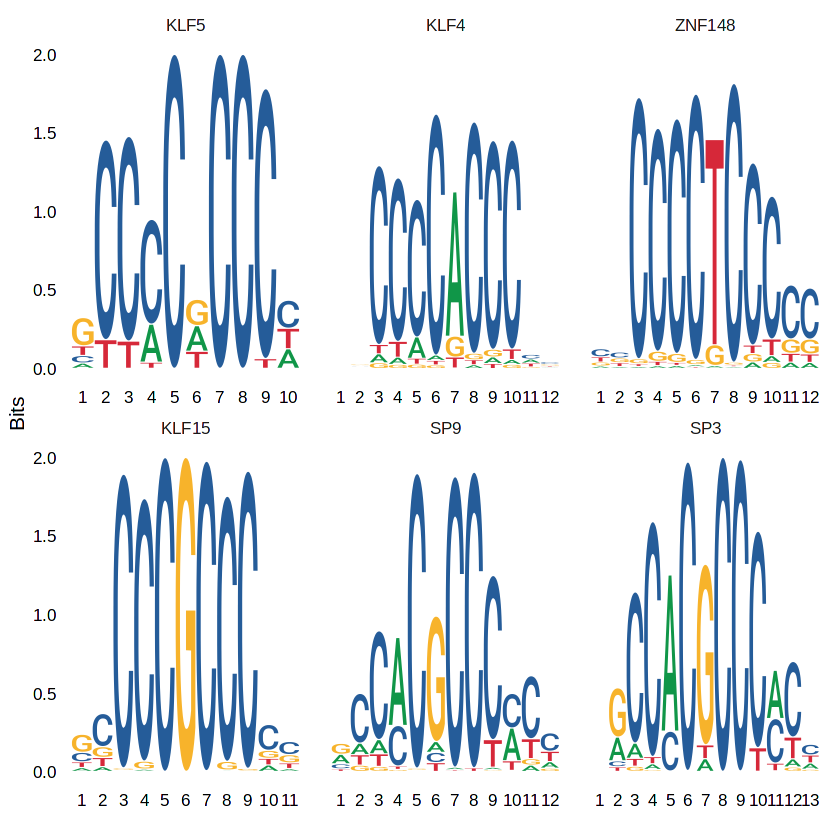

In [92]:
library(ggseqlogo)

# We can also plot the position weight matrices for the motifs, so we can visualize the different motif sequences.
MotifPlot(
  object = pbmc,
  motifs = head(rownames(enriched.motifs))
)

Warning message:
"`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead."


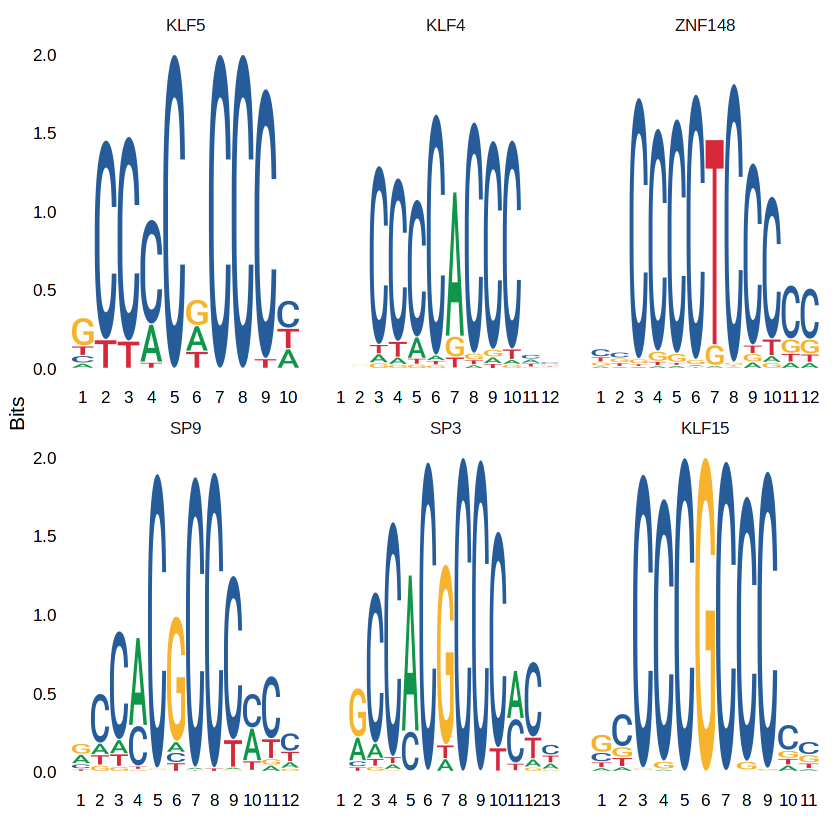

In [93]:
# We can also plot the position weight matrices for the motifs, so we can visualize the different motif sequences.
MotifPlot(
  object = pbmc,
  motifs = head(rownames(enriched.motifs.bg_corrected))
)

The identified motifs should be cross-checked with (1) references, and (2) gene expression data to see if these TFs are indeed highly expressed in the given cell type (cluster).

## Computing motif activities

Signac: We can also compute a per-cell motif activity score by running chromVAR. This allows us to visualize motif activities per cell, and also provides an alternative method of identifying differentially-active motifs between cell types.

ChromVAR identifies motifs associated with variability in chromatin accessibility between cells. See the chromVAR paper for a complete description of the method. (Schep and Greenleaf et al., Nature Methods, 2017)
https://www.nature.com/articles/nmeth.4401

In [506]:
library(chromVAR)

# Run chromVAR
TDR118 <- RunChromVAR(
  object = TDR118,
  genome = BSgenome.Drerio.UCSC.danRer11
)

DefaultAssay(TDR118) <- 'chromvar'

p1 <- DimPlot(TDR118, label=TRUE) + NoLegend()

# look at the activity of tbxta
p2 <- FeaturePlot(
  object = TDR118,
  features = "tbxta",
  min.cutoff = 'q10',
  max.cutoff = 'q90',
  pt.size = 0.1
)
p1 + p2

ERROR: Error in GetMotifData.ChromatinAssay(object = object, slot = "data"): Motif object not present in assay


We can also directly test for differential activity scores between cell types. This tends to give similar results as performing an enrichment test on differentially accessible peaks between the cell types (shown above).

When performing differential testing on the chromVAR z-score, we can set mean.fxn=rowMeans and fc.name="avg_diff" in the FindMarkers() function so that the fold-change calculation computes the average difference in z-score between the groups.

In [106]:
differential.activity <- FindMarkers(
  object = pbmc,
  ident.1 = 'CD4 T',
  ident.2 = 'CD8 T',
  only.pos = TRUE,
  mean.fxn = rowMeans,
  fc.name = "avg_diff"
)

MotifPlot(
  object = pbmc,
  motifs = head(rownames(differential.activity)),
  assay = 'peaks'
)

ERROR: Error in length(split)/num_pos: non-numeric argument to binary operator


In [116]:
# save the Seurat object

# save as RDS
saveRDS(object = pbmc, "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/pbmc_signac_example.RDS")

# save as h5Seurat
SaveH5Seurat(object = pbmc, 
             filename = "/data/yangjoon.kim/bruno/projects/data.science/yangjoon.kim/zebrahub_multiome/data/annotated_data/pbmc_signac_example.h5Seurat", 
             overwrite = TRUE)

# Step 8. Identifying gene regulatory network (Cicero)

- Cicero: an R package from Cole Trapnell's lab.
Vignette in Signac: https://stuartlab.org/signac/articles/cicero.html

In this vignette we will demonstrate how to find cis-co-accessible networks with Cicero using single-cell ATAC-seq data. Please see the Cicero website for information about Cicero.

To facilitate conversion between the Seurat (used by Signac) and CellDataSet (used by Cicero) formats, we will use a conversion function in the SeuratWrappers package available on GitHub.


Cicero: Cicero can help you perform two main types of analysis:

Constructing and analysing cis-regulatory networks. Cicero analyzes co-accessibility to identify putative cis-regulatory interactions, and uses various techniques to visualize and analyze them.
General single-cell chromatin accessibility analysis . Cicero also extends the software package Monocle to allow for identification of differential accessibility, clustering, visualization, and trajectory reconstruction using single-cell chromatin accessibility data.


In [357]:
# BiocManager::install("cicero",type = "source", force = TRUE)

In [355]:
# # Install Cicero
# if (!requireNamespace("remotes", quietly = TRUE))
#     install.packages("remotes")
# remotes::install_github("cole-trapnell-lab/cicero-release", ref = "monocle3")

In [354]:
# # BiocManager::install("SeuratWrappers",type = "source", force = TRUE)
# remotes::install_github('satijalab/seurat-wrappers', force = TRUE)

In [152]:
# devtools::install_github("satijalab/seurat-wrappers", force=TRUE)

Rcpp         (1.0.8.3    -> 1.0.10    ) [CRAN]
irlba        (2.3.5      -> 2.3.5.1   ) [CRAN]
RcppAnnoy    (0.0.19     -> 0.0.20    ) [CRAN]
FNN          (1.1.3.1    -> 1.1.3.2   ) [CRAN]
polyclip     (1.10-0     -> 1.10-4    ) [CRAN]
deldir       (1.0-6      -> 1.0-9     ) [CRAN]
spatstat.... (2.3-1      -> 3.0-3     ) [CRAN]
spatstat.... (2.2-0      -> 3.0-1     ) [CRAN]
spatstat.... (2.1-1      -> 3.0-1     ) [CRAN]
spatstat.... (2.2-0      -> 3.1-5     ) [CRAN]
spatstat.... (2.4-0      -> 3.2-1     ) [CRAN]
fs           (1.6.1      -> 1.6.2     ) [CRAN]
cli          (3.4.1      -> 3.6.1     ) [CRAN]
sass         (0.4.1      -> 0.4.6     ) [CRAN]
cachem       (1.0.7      -> 1.0.8     ) [CRAN]
bslib        (0.4.0      -> 0.4.2     ) [CRAN]
commonmark   (1.8.0      -> 1.9.0     ) [CRAN]
rlang        (1.0.6      -> 1.1.1     ) [CRAN]
sourcetools  (0.1.7      -> 0.1.7-1   ) [CRAN]
htmltools    (0.5.3      -> 0.5.5     ) [CRAN]
fontawesome  (0.2.2      -> 0.5.1     ) [CRAN]
httpuv       

Installing 74 packages: Rcpp, irlba, RcppAnnoy, FNN, polyclip, deldir, spatstat.utils, spatstat.data, spatstat.sparse, spatstat.random, spatstat.geom, fs, cli, sass, cachem, bslib, commonmark, rlang, sourcetools, htmltools, fontawesome, httpuv, parallelly, listenv, globals, RcppEigen, progressr, future.apply, future, sp, stringi, fansi, stringr, plyr, scales, gtable, vctrs, tidyselect, tibble, pillar, generics, RcppArmadillo, matrixStats, ggplot2, dplyr, gtools, png, RcppTOML, sys, tinytex, xfun, highr, curl, rmarkdown, knitr, data.table, purrr, tidyr, htmlwidgets, httr, shiny, zoo, igraph, reticulate, uwot, spatstat.explore, SeuratObject, scattermore, plotly, pbapply, ica, fitdistrplus, Seurat, BiocManager

Installing packages into '/usr/local/lib/R/site-library'
(as 'lib' is unspecified)

Warning message in i.p(...):
"installation of package 'Rcpp' had non-zero exit status"
Warning message in i.p(...):
"installation of package 'irlba' had non-zero exit status"
Warning message in i.p(

✔  checking for file ‘/tmp/RtmpIA3Um0/remotes196115aedd828/satijalab-seurat-wrappers-d28512f/DESCRIPTION’ (1.9s)
─  preparing ‘SeuratWrappers’:
✔  checking DESCRIPTION meta-information
─  checking for LF line-endings in source and make files and shell scripts
─  checking for empty or unneeded directories
   Omitted ‘LazyData’ from DESCRIPTION
─  building ‘SeuratWrappers_0.3.1.tar.gz’
   


Installing package into '/usr/local/lib/R/site-library'
(as 'lib' is unspecified)

Warning message in i.p(...):
"installation of package '/tmp/RtmpIA3Um0/file196115bfd61cf/SeuratWrappers_0.3.1.tar.gz' had non-zero exit status"


In [145]:
# install.packages("R.utils")

Installing package into '/usr/local/lib/R/site-library'
(as 'lib' is unspecified)

Warning message in install.packages("R.utils"):
"installation of package 'R.utils' had non-zero exit status"


In [144]:
is_installed <- "SeuratWrappers" %in% installed.packages()
is_installed

[1] FALSE

In [507]:
library(SeuratWrappers)

ERROR: Error in library(SeuratWrappers): there is no package called ‘SeuratWrappers’


In [508]:
#library(SeuratWrappers)
library(cicero)

Loading required package: monocle3


Attaching package: ‘monocle3’


The following objects are masked from ‘package:Biobase’:

    exprs, fData, fData<-, pData, pData<-


Loading required package: Gviz

Loading required package: grid


Attaching package: ‘grid’


The following object is masked from ‘package:Biostrings’:

    pattern



Attaching package: 'Gviz'


The following object is masked from 'package:TFBSTools':

    tags




In [510]:
TDR118

An object of class Seurat 
619951 features across 13022 samples within 4 assays 
Active assay: peaks_celltype (316881 features, 316880 variable features)
 3 other assays present: RNA, ATAC, SCT
 8 dimensional reductions calculated: pca, umap, lsi, atac.umap, wnn.umap, umap.pca30, lsi.cellranger, atac.umap.cellranger

In [511]:
# convert to CellDataSet format and make the cicero object
TDR118.cds <- as.cell_data_set(x = TDR118)
TDR118.cicero <- make_cicero_cds(TDR118.cds, reduced_coordinates = reducedDims(TDR118.cds)$UMAP)


ERROR: Error in as.cell_data_set(x = TDR118): could not find function "as.cell_data_set"


## Quick QC metric comparison between Zebrahub and Multiome

- method: scRNA-seq and multiome



In [333]:
# adding metadata for the "method"
reference_15somite$method = "scRNA-seq"
TDR118_unfiltered$method = "multiome"

In [334]:
joint <- merge(reference_15somite, TDR118_unfiltered)
joint

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard Assay objects.”


An object of class Seurat 
303962 features across 20727 samples within 3 assays 
Active assay: SCT (23009 features, 0 variable features)
 2 other assays present: RNA, ATAC

[1] 2